In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import pandas_profiling
import dalex
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 300)

In [3]:
train = pd.read_csv('train_data.csv')
test = pd.read_csv('test_data.csv')
station = pd.read_csv('station_list.csv')

訓練データ
- name	施設名称	Downtown next to Koji-Machi
- host_id	施設の提供者の識別子（乱数化済）	181893395
- neighbourhood	所在地（東京都の23の特別区のいずれか）	Shinjuku Ku
- latitude	緯度	3568185
- longitude	経度	139.68077
- room_type	部屋の形式 (Entire home/apt|Private room|Shared room|Hotel room)	Entire home/apt
- minimum_nights	最短宿泊日数	1
- number_of_reviews	評価件数	523
- last_review	最終評価日	2020-02-03
- reviews_per_month	月当たりの評価件数	1.67
- availability_365	年間の宿泊可能日数	288
- y	1泊あたりの宿泊料金	9923

駅の緯度経度データ
- station_name	駅名	東京
- longitude	経度	139.766103
- latitude	緯度	35.681391

In [4]:
train.shape, test.shape, station.shape

((9990, 13), (4996, 12), (746, 3))

In [5]:
train.head()

,id,name,host_id,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y
0,1,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,242899459,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008
1,2,Downtown Tokyo Iriya next to Ueno,308879948,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667
2,3,"Japan Style,Private,Affordable,4min to Sta.",300877823,Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923
3,4,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,236935461,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109
4,5,LICENSED SHINJUKU HOUSE: Heart of the action!,243408889,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390


In [6]:
test.head()

,id,name,host_id,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365
0,1,"5-minute walk from Akasaka Sta, Superior double",184730720,Minato Ku,35.67131,139.73285,Private room,1,0,NaN,NaN,183
1,2,7 min Sta.-Center of IKEBUKURO Cozy Room#503,20993205,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337
2,3,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,322521715,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240
3,4,Komagome Station 2 minutes on foot,234477095,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0
4,5,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",145453833,Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164


In [7]:
station.head()

,station_name,longitude,latitude
0,白丸,139.114861,35.811735
1,古里,139.152102,35.816247
2,川井,139.164290,35.813697
3,御嶽,139.182589,35.801468
4,沢井,139.193324,35.805940


In [8]:
train.isnull().sum()

id                      0
name                    0
host_id                 0
neighbourhood           0
latitude                0
longitude               0
room_type               0
minimum_nights          0
number_of_reviews       0
last_review          1699
reviews_per_month    1699
availability_365        0
y                       0
dtype: int64

In [9]:
test.isnull().sum()

id                     0
name                   0
host_id                0
neighbourhood          0
latitude               0
longitude              0
room_type              0
minimum_nights         0
number_of_reviews      0
last_review          832
reviews_per_month    832
availability_365       0
dtype: int64

In [10]:
station.isnull().sum()

station_name    0
longitude       0
latitude        0
dtype: int64

In [11]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 9990 non-null   int64  
 1   name               9990 non-null   object 
 2   host_id            9990 non-null   int64  
 3   neighbourhood      9990 non-null   object 
 4   latitude           9990 non-null   float64
 5   longitude          9990 non-null   float64
 6   room_type          9990 non-null   object 
 7   minimum_nights     9990 non-null   int64  
 8   number_of_reviews  9990 non-null   int64  
 9   last_review        8291 non-null   object 
 10  reviews_per_month  8291 non-null   float64
 11  availability_365   9990 non-null   int64  
 12  y                  9990 non-null   int64  
dtypes: float64(3), int64(6), object(4)
memory usage: 1014.7+ KB


In [12]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4996 entries, 0 to 4995
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 4996 non-null   int64  
 1   name               4996 non-null   object 
 2   host_id            4996 non-null   int64  
 3   neighbourhood      4996 non-null   object 
 4   latitude           4996 non-null   float64
 5   longitude          4996 non-null   float64
 6   room_type          4996 non-null   object 
 7   minimum_nights     4996 non-null   int64  
 8   number_of_reviews  4996 non-null   int64  
 9   last_review        4164 non-null   object 
 10  reviews_per_month  4164 non-null   float64
 11  availability_365   4996 non-null   int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 468.5+ KB


In [13]:
#欠損値レコードの確認
#すべて同一レコードかどうか
trnul = train.query('last_review != last_review & reviews_per_month != reviews_per_month')
tsnul = test.query('last_review != last_review & reviews_per_month != reviews_per_month')

In [14]:
len(trnul), len(tsnul)

(1699, 832)

In [15]:
len(train.query('number_of_reviews == 0')), len(test.query('number_of_reviews == 0'))

(1699, 832)

- 欠損データがあるカラムはlast_reviewとreviews_per_monthの二つ
- train,test両方とも、last_reviewとreviews_per_monthが両方とも欠損しているレコード
- number_of_reviewsが0→評価件数がないデータが欠損している

- まずは欠損値を「データそのものがない」という仮定のもと0で補完

In [16]:
#欠損値の補完、ひと月当たりのレビューデータなし、という仮定で0を補完
train['reviews_per_month'].fillna(0, inplace=True)
test['reviews_per_month'].fillna(0, inplace=True)

In [17]:
#欠損値の補完、最後に閲覧された月のデータなし、という仮定で仮の日程'2100-01-01'で補完
train['last_review'].fillna('2100-01-01', inplace=True)
test['last_review'].fillna('2100-01-01', inplace=True)

In [18]:
train.isnull().sum()

id                   0
name                 0
host_id              0
neighbourhood        0
latitude             0
longitude            0
room_type            0
minimum_nights       0
number_of_reviews    0
last_review          0
reviews_per_month    0
availability_365     0
y                    0
dtype: int64

In [19]:
test.isnull().sum()

id                   0
name                 0
host_id              0
neighbourhood        0
latitude             0
longitude            0
room_type            0
minimum_nights       0
number_of_reviews    0
last_review          0
reviews_per_month    0
availability_365     0
dtype: int64

In [20]:
#日付データを文字列から日付型へ変換
from datetime import datetime as dt
train['last_review_D'] = train['last_review'].apply(lambda x: dt.strptime(x, '%Y-%m-%d') if x == x and x != 0 else 0)
test['last_review_D'] = test['last_review'].apply(lambda x: dt.strptime(x, '%Y-%m-%d') if x == x and x != 0 else 0)


In [21]:
train.head()

,id,name,host_id,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
0,1,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,242899459,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25
1,2,Downtown Tokyo Iriya next to Ueno,308879948,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25
2,3,"Japan Style,Private,Affordable,4min to Sta.",300877823,Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23
3,4,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,236935461,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02
4,5,LICENSED SHINJUKU HOUSE: Heart of the action!,243408889,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30


In [22]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   id                 9990 non-null   int64         
 1   name               9990 non-null   object        
 2   host_id            9990 non-null   int64         
 3   neighbourhood      9990 non-null   object        
 4   latitude           9990 non-null   float64       
 5   longitude          9990 non-null   float64       
 6   room_type          9990 non-null   object        
 7   minimum_nights     9990 non-null   int64         
 8   number_of_reviews  9990 non-null   int64         
 9   last_review        9990 non-null   object        
 10  reviews_per_month  9990 non-null   float64       
 11  availability_365   9990 non-null   int64         
 12  y                  9990 non-null   int64         
 13  last_review_D      9990 non-null   datetime64[ns]
dtypes: datet

In [23]:
test.head()

,id,name,host_id,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
0,1,"5-minute walk from Akasaka Sta, Superior double",184730720,Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01
1,2,7 min Sta.-Center of IKEBUKURO Cozy Room#503,20993205,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16
2,3,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,322521715,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12
3,4,Komagome Station 2 minutes on foot,234477095,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17
4,5,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",145453833,Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21


In [24]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4996 entries, 0 to 4995
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   id                 4996 non-null   int64         
 1   name               4996 non-null   object        
 2   host_id            4996 non-null   int64         
 3   neighbourhood      4996 non-null   object        
 4   latitude           4996 non-null   float64       
 5   longitude          4996 non-null   float64       
 6   room_type          4996 non-null   object        
 7   minimum_nights     4996 non-null   int64         
 8   number_of_reviews  4996 non-null   int64         
 9   last_review        4996 non-null   object        
 10  reviews_per_month  4996 non-null   float64       
 11  availability_365   4996 non-null   int64         
 12  last_review_D      4996 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(3), int64(5), object(4)
memory us

仮説
- last_reviewとreviews_per_monthの双方のデータが欠損している物件が、そもそもなぜ欠損しているか
- number_of_reviews=0のもの
- 1)最近新しく登録されたもの
- 2)登録されてから何らかの事情で見られていないもの

In [25]:
#idとhost_idは元の情報が氏名や団体名の可能性があり、有用度は低いのでと仮定
#データを他テーブルへ保存
train_ids = train[['id', 'host_id']]
train.drop(['id', 'host_id'], axis=1, inplace=True)

In [26]:
train.head()

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02
4,LICENSED SHINJUKU HOUSE: Heart of the action!,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30


In [27]:
train.shape

(9990, 12)

In [28]:
train_ids

,id,host_id
0,1,242899459
1,2,308879948
2,3,300877823
3,4,236935461
4,5,243408889
...,...,...
9985,9986,59104733
9986,9987,131595566
9987,9988,147026065
9988,9989,316273494


In [29]:
#idとhost_idは元の情報が氏名や団体名の可能性があり、有用度は低いのでと仮定
#データを他テーブルへ保存
test_ids = test[['id', 'host_id']]
test.drop(['id', 'host_id'], axis=1, inplace=True)

In [30]:
test.head()

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
0,"5-minute walk from Akasaka Sta, Superior double",Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01
1,7 min Sta.-Center of IKEBUKURO Cozy Room#503,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16
2,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17
4,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21


In [31]:
test.shape

(4996, 11)

In [32]:
test_ids

,id,host_id
0,1,184730720
1,2,20993205
2,3,322521715
3,4,234477095
4,5,145453833
...,...,...
4991,4992,166712541
4992,4993,58261300
4993,4994,243229864
4994,4995,50190468


In [33]:
# #目的変数yの分離
# y_train = train.pop('y')

In [34]:
# y_train

In [35]:
train.shape

(9990, 12)

In [36]:
train.describe()

,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,availability_365,y
count,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9.990000e+03
mean,35.699999,139.742668,3.331331,25.943143,1.410986,157.202102,2.510464e+04
std,0.040132,0.054896,8.504451,40.586283,1.428561,115.780646,6.704985e+04
min,35.540990,139.575070,1.000000,0.000000,0.000000,0.000000,9.210000e+02
25%,35.687173,139.702483,1.000000,2.000000,0.280000,63.000000,6.960750e+03
50%,35.703460,139.732830,1.000000,11.000000,1.120000,154.000000,1.189250e+04
75%,35.725695,139.785420,2.000000,33.000000,2.220000,248.000000,2.008500e+04
max,35.815950,139.911970,365.000000,529.000000,43.600000,365.000000,1.000103e+06


In [37]:
test.describe()

,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,availability_365
count,4996.000000,4996.000000,4996.000000,4996.000000,4996.000000,4996.000000
mean,35.698639,139.739712,3.204964,28.012610,1.434197,153.018415
std,0.039766,0.055474,10.347555,41.047564,1.355913,115.443609
min,35.540760,139.592570,1.000000,0.000000,0.000000,0.000000
25%,35.687880,139.700915,1.000000,2.000000,0.310000,62.000000
50%,35.702720,139.725515,1.000000,13.000000,1.230000,141.000000
75%,35.723850,139.786620,2.000000,36.000000,2.210000,246.000000
max,35.797070,139.905810,365.000000,407.000000,19.700000,365.000000


- minimum_nightsにある365は、最短宿泊日数が1だと365連泊となる。これは「住んでいる」のではないかと仮定
- レビューが極端に多いのは、人気がある可能性。人気の要因は駅からの距離や値段などがないかを検討

In [38]:
#数値型データと文字列データの分割
string = [i for i in train.columns if train[i].dtype == 'object']
numeric = [i for i in train.columns if train[i].dtype != 'object']

In [39]:
string

['name', 'neighbourhood', 'room_type', 'last_review']

In [40]:
numeric

['latitude',
 'longitude',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'availability_365',
 'y',
 'last_review_D']

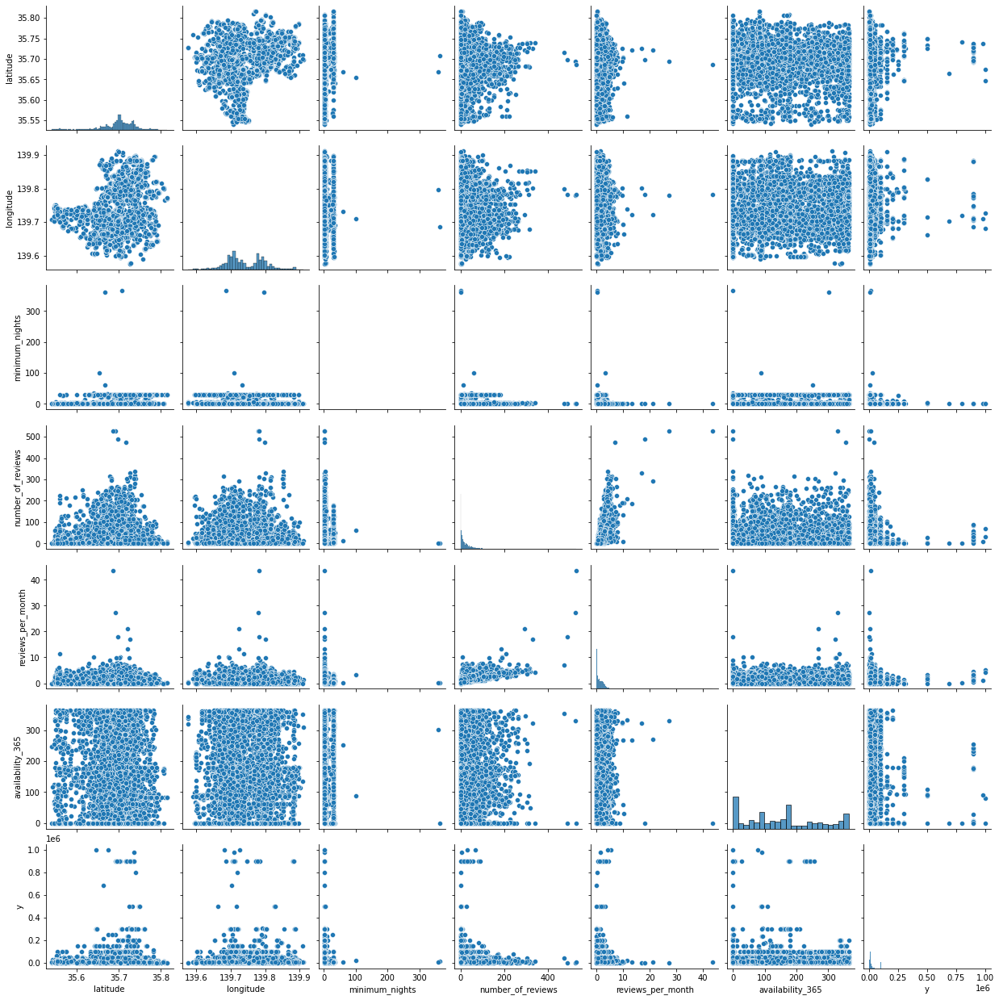

In [41]:
#データの散布図を見てみる
#数値データと目標値yとの関係。id,host_idを除く

sns.pairplot(data=train[numeric])

- number_of_reviewsとreviews_per_monthの間に、ほかの特徴量と比較して関係がありそう
- 各特徴量のヒストグラムを見る

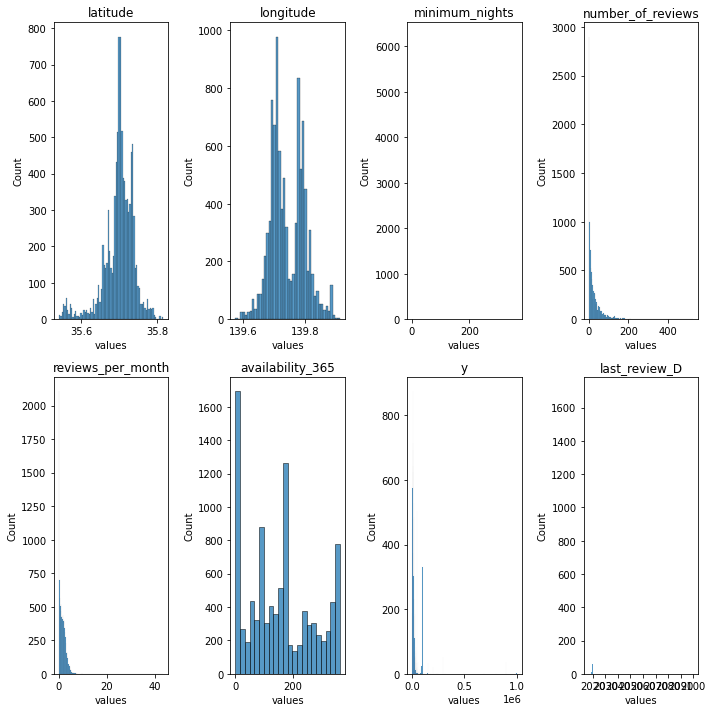

In [42]:
fig, axes = plt.subplots(2, 4, figsize=(10,10))

for col, ax in zip(numeric, axes.ravel()):
    sns.histplot(train, x=train[col], stat='count', ax=ax)
    ax.set_xlabel('values')
    ax.set_title(col)
plt.tight_layout()
plt.show()

In [43]:
train['minimum_nights'].value_counts()

1      6217
2      2342
3       476
30      466
7        85
4        74
5        71
23       63
6        45
28       37
14       26
31       20
15       11
12       11
10        9
29        7
13        6
25        5
20        4
21        3
9         2
32        2
360       1
8         1
16        1
24        1
365       1
60        1
100       1
35        1
Name: minimum_nights, dtype: int64

In [44]:
train['number_of_reviews'].value_counts()

0      1699
1       711
2       491
3       431
4       326
6       277
5       238
7       223
8       215
9       186
11      178
14      174
10      165
13      162
12      145
17      140
16      137
15      137
18      121
19      113
20      113
22      105
23      103
21      102
24      100
29       98
28       93
27       91
30       89
25       87
26       82
32       78
34       73
31       68
38       63
35       62
33       58
39       58
40       57
41       57
44       55
43       54
36       52
49       52
46       51
42       49
37       47
50       47
52       44
45       43
54       43
57       39
51       39
53       39
47       39
58       36
48       34
65       32
55       30
61       30
56       27
73       25
59       25
64       25
60       23
67       23
66       23
63       23
82       22
72       22
62       22
77       20
69       20
81       19
78       18
87       17
80       17
71       17
68       17
76       17
75       17
95       16
70       16
94  

In [45]:
train['reviews_per_month'].value_counts()

0.00    1699
1.00      87
0.25      59
0.32      58
0.30      47
        ... 
5.01       1
4.66       1
5.84       1
4.37       1
5.73       1
Name: reviews_per_month, Length: 595, dtype: int64

In [46]:
train['y'].value_counts()

9931     10
9930      7
9956      7
6008      7
9988      7
         ..
12352     1
8781      1
6840      1
25079     1
45041     1
Name: y, Length: 7520, dtype: int64

- minimum_nights,number_of_reviews,reviews_per_monthがそれぞれ外れ値的な挙動を示しているデータがありそう
- 目的変数yの値もばらつきがみられるので、拡大したヒストグラムを表示する
- logitudeのヒストグラムに山が二つある

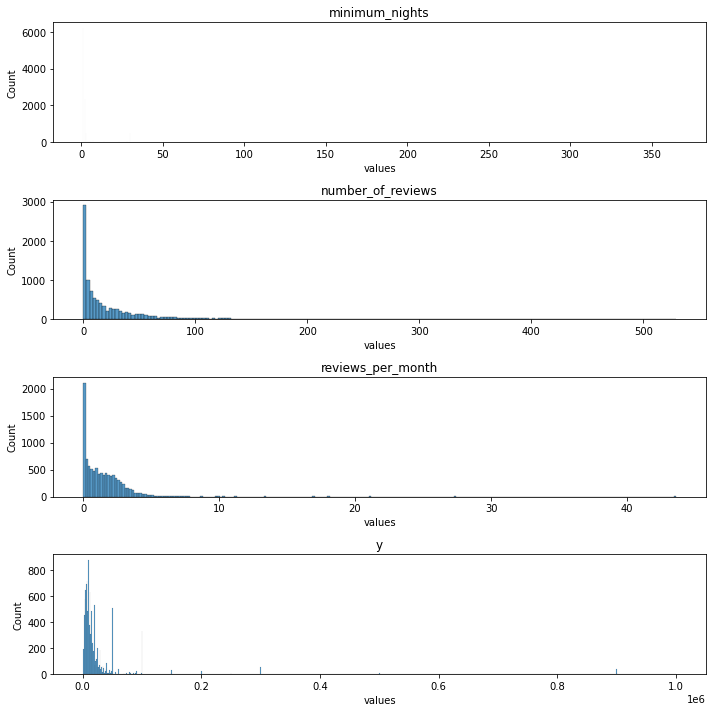

In [47]:
#「外れ値」的なデータが示される特徴量のグラフ
fig, axes = plt.subplots(4, 1, figsize=(10,10))
cols = ['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'y']

for col, ax in zip(cols, axes.ravel()):
    sns.histplot(train, x=train[col], stat='count', ax=ax)
    ax.set_xlabel('values')
    ax.set_title(col)
plt.tight_layout()
plt.show()

- testデータも同様に確かめる

In [48]:
test

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
0,"5-minute walk from Akasaka Sta, Superior double",Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01
1,7 min Sta.-Center of IKEBUKURO Cozy Room#503,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16
2,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17
4,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21
...,...,...,...,...,...,...,...,...,...,...,...
4991,Stylish Pad In Nishi Shinjuku - Free WiFi!,Shibuya Ku,35.68555,139.68015,Entire home/apt,2,31,2019-12-15,1.60,174,2019-12-15
4992,U-6 鶯谷 BasaeInn Uguisudani Tokyo,Taito Ku,35.72499,139.77741,Shared room,2,6,2018-08-25,0.27,90,2018-08-25
4993,A convenient room! 〜SHINJUKU〜 【Pocket WiFi】,Shinjuku Ku,35.69102,139.70614,Entire home/apt,1,12,2020-03-14,2.54,113,2020-03-14
4994,Shinjuku ShareHouse Dormitory1 with Balcony,Shinjuku Ku,35.69848,139.70435,Shared room,2,71,2020-01-01,0.96,273,2020-01-01


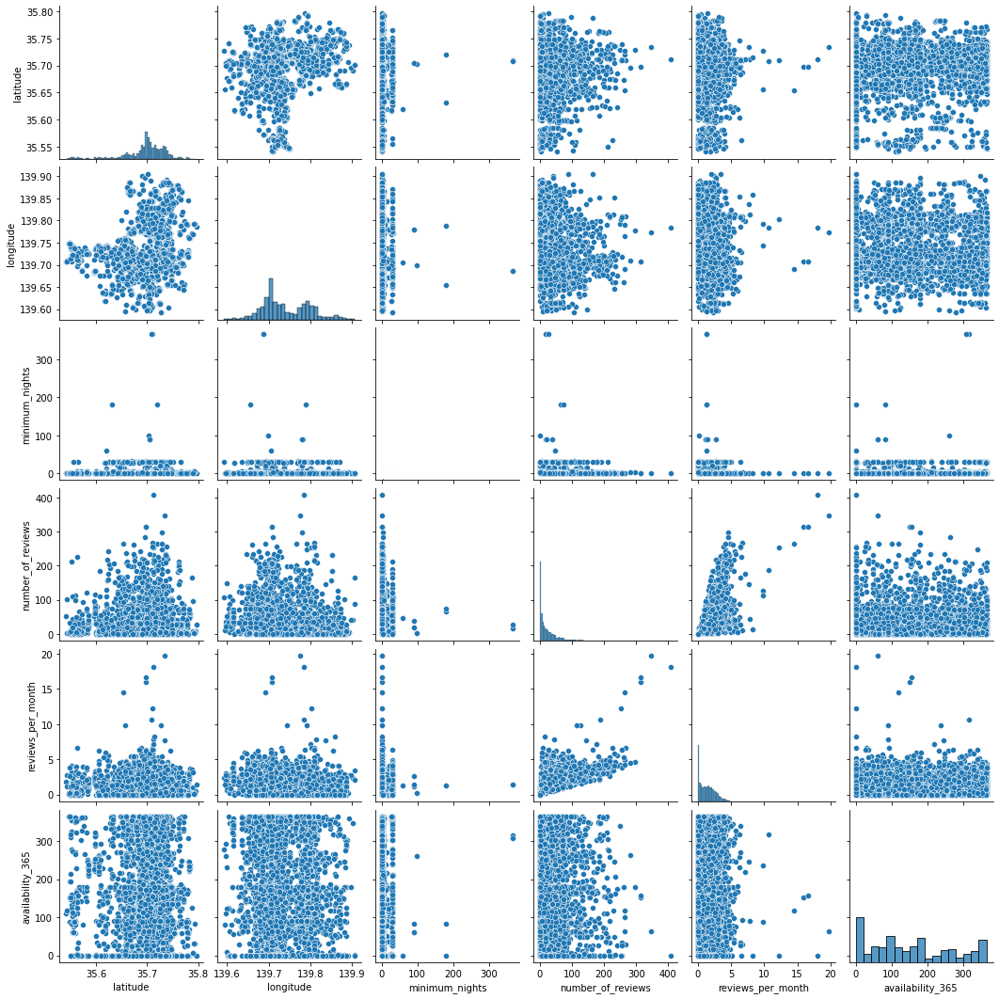

In [49]:
colums= ['latitude','longitude','minimum_nights','number_of_reviews','reviews_per_month','availability_365','last_review_D']
sns.pairplot(data=test[colums])

- trainデータと同様に、reviews_per_month,number_of_reviewsの間に何らかの関係がありそう

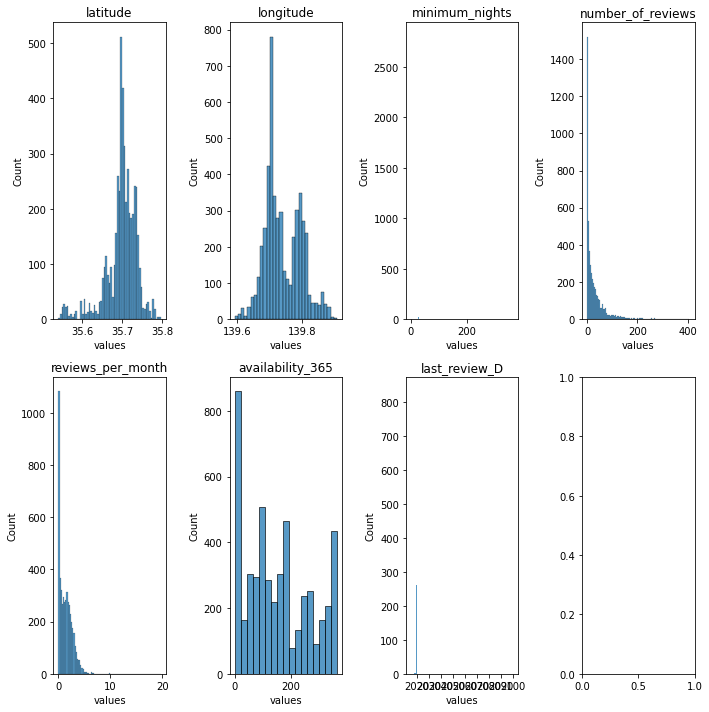

In [50]:
#testデータにおいてヒストグラムを見てみる
fig, axes = plt.subplots(2, 4, figsize=(10,10))

for col, ax in zip(colums, axes.ravel()):
    sns.histplot(test, x=test[col], ax=ax)
    ax.set_xlabel('values')
    ax.set_title(col)
plt.tight_layout()
plt.show()

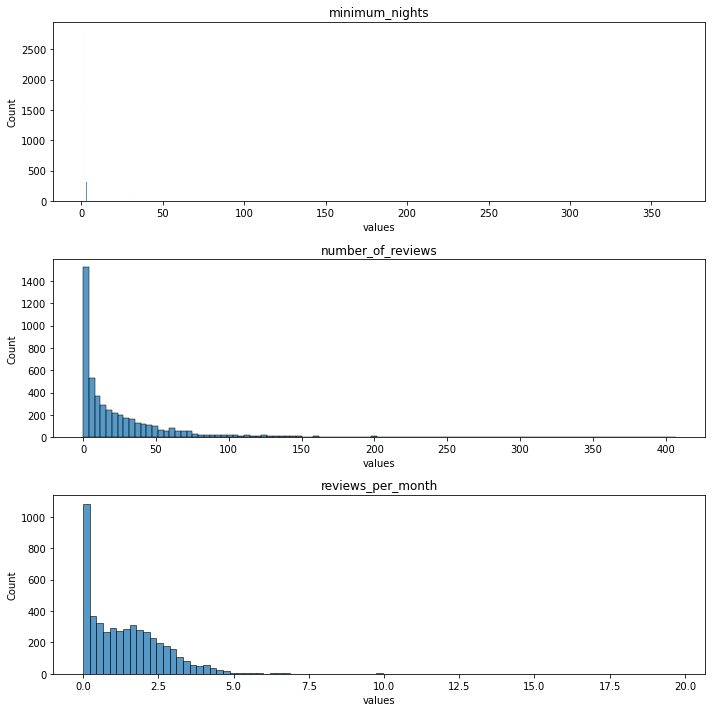

In [51]:
#「外れ値」的なデータが示される特徴量のグラフ
fig, axes = plt.subplots(3, 1, figsize=(10,10))
tcol = ['minimum_nights', 'number_of_reviews', 'reviews_per_month']

for col, ax in zip(tcol, axes.ravel()):
    sns.histplot(test, x=test[col], stat='count', ax=ax)
    ax.set_xlabel('values')
    ax.set_title(col)
plt.tight_layout()
plt.show()

- testデータもtrainデータと同じように外れ値的な値がみられる。
- trainデータよりもデータ範囲が狭そう
- 箱ひげ図でtrainとtestの差を見てみる

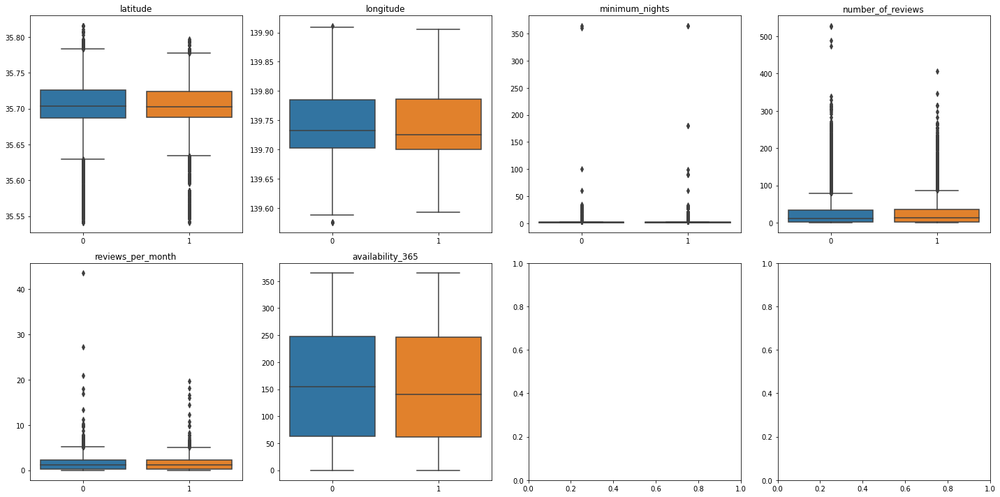

In [52]:
#箱ひげ図
fig, axes = plt.subplots(2, 4, figsize=(20,10))

nums = ['latitude','longitude','minimum_nights','number_of_reviews','reviews_per_month','availability_365']

for col, ax in zip(nums, axes.ravel()):
    sns.boxplot(data=[train[col], test[col]], ax=ax)
    ax.set_title(col)
    
plt.tight_layout()
plt.show()

- 箱ひげ図において、第1四分位から第3四分位までおおよそ似た傾向がある
- testデータに比べてtrainデータのほうがnumber_of_reviews、reviews_per_monthに四分位範囲を超えるデータの幅が広いことが分かる

In [53]:
#last_review_Dの最大、最小値を見る
#trainもtestも最新の日付は近い
#testデータはtrainデータよりも1年以上前のデータを持つ

for i, df in enumerate([train,test]):
    t_day = df.query('last_review_D < datetime.datetime(2100,1,1)').agg({'last_review_D':['max','min']})
    if i==0:
        print('train')
    else:
        print('test')
    print(t_day)


train
    last_review_D
max    2020-04-29
min    2016-11-19
test
    last_review_D
max    2020-04-28
min    2015-05-25


In [54]:
#minimum_nightsについて、50以上のデータを抽出してみる→4件
#すべてEntire home/apt(自宅、アパート全体)
#minimum_nightsが365の物件は、availability_365が0→日ごろから民泊営業していない？
train.query('minimum_nights > 50')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
2103,EarlyCheckIn/NewAprt./Legal/ShibuyaSta.8mins/WiFi,Shibuya Ku,35.65420,139.70905,Entire home/apt,100,62,2020-01-01,3.26,89,25086,2020-01-01
4189,Perfect Studio in Roppongi / Tokyo Midtown,Minato Ku,35.66832,139.73198,Entire home/apt,60,13,2020-01-07,0.28,252,5462,2020-01-07
4359,0. ENTIRE APARTMENT 450ft 2LDK NEAR SHIBUYA/YO...,Nakano Ku,35.70829,139.68678,Entire home/apt,365,1,2019-08-05,0.11,0,15107,2019-08-05
4738,"Etchujima - spacious, luxurious, family friendly",Koto Ku,35.66842,139.79696,Entire home/apt,360,3,2019-02-23,0.14,301,9945,2019-02-23


<AxesSubplot:xlabel='minimum_nights', ylabel='Count'>

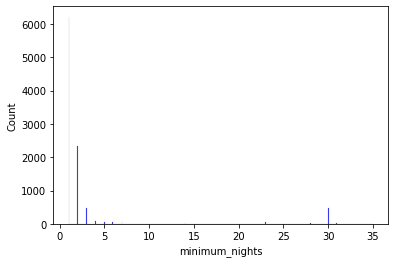

In [55]:
#minimum_nightsが50以下の物件について、ヒストグラムを見てみる
#30日(1か月)利用が存在
tr_nigt = train.query('minimum_nights < 50')
sns.histplot(data=tr_nigt, x=tr_nigt['minimum_nights'], color='blue', stat='count')

In [56]:
#利用日数を割合で示してみる
#1泊利用が全体の約62%で次いで2泊利用が23%
tmp = pd.DataFrame({'night_count':train['minimum_nights'].value_counts(), 
                    'pct':train['minimum_nights'].value_counts(). \
                    apply(lambda x: x/train['minimum_nights'].value_counts().sum())})


week = np.sum([tmp['pct'][i] for i in tmp.index if i < 8])
month = np.sum([tmp['pct'][i] for i in tmp.index if i==30 or i==28 or i==31]) #土日含む
print(f'week{week:.4f},month{month:.4f}')

week0.9319,month0.0524


In [57]:
tmp

,night_count,pct
1,6217,0.622322
2,2342,0.234434
3,476,0.047648
30,466,0.046647
7,85,0.008509
4,74,0.007407
5,71,0.007107
23,63,0.006306
6,45,0.004505
28,37,0.003704


- 1週間利用までで全体の約93%
- うち1日利用が62%、2日利用が23%
- 土日含む30日前後利用が全体の5%
- 最短宿泊日数が0の物件はない

In [58]:
train['minimum_nights'].value_counts().sum()

9990

In [59]:
tmp.sum()

night_count    9990.0
pct               1.0
dtype: float64

In [60]:
train.head(2)

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25


In [61]:
#number_of_reviewの情報を見る
#trainデータの全体の5%が100件以上の評価件数あり。人気の基準となるか

print(len(train.query('number_of_reviews > 100'))/len(train)) #100より多い
train.query('number_of_reviews > 100')

0.05345345345345345


,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
39,501/MAX 5guests/Ryogoku/Asakusa/Skytree/Pocket...,Sumida Ku,35.70240,139.79844,Entire home/apt,1,113,2020-04-26,5.65,156,16649,2020-04-26
56,Juyoh Hotel Single Room with High-Bed and Shar...,Taito Ku,35.72789,139.80154,Private room,1,125,2020-03-17,6.50,337,2996,2020-03-17
58,ShinjukuTokyo Treehouse Free Pocket Wifi Certi...,Shinjuku Ku,35.71088,139.71213,Entire home/apt,2,165,2020-03-01,3.57,319,16257,2020-03-01
67,"Ikebukuro tatami apartment B, public bath, wi-fi",Toshima Ku,35.73057,139.69806,Entire home/apt,2,144,2020-01-25,3.51,0,4228,2020-01-25
87,So convenient All in 3minutes!wi-fi,Itabashi Ku,35.78457,139.67793,Entire home/apt,3,102,2020-01-20,2.41,174,4497,2020-01-20
...,...,...,...,...,...,...,...,...,...,...,...,...
9954,(Eng日中) BIG 3Bedroom Apartment Airport Easy Ac...,Arakawa Ku,35.73470,139.76833,Entire home/apt,2,116,2020-02-28,2.21,168,23997,2020-02-28
9961,My apartment is comfortable Located a 4-minute...,Shinjuku Ku,35.70075,139.70320,Private room,1,106,2020-03-10,2.56,0,5423,2020-03-10
9965,"Japanese Modern Apt, 2 Stops to Shinjuku (#3)",Shibuya Ku,35.67837,139.68001,Entire home/apt,1,159,2020-03-25,2.81,81,49886,2020-03-25
9970,3min to Asakusa St.|New&Clean|Sky-tree|Wifi|1F,Taito Ku,35.70631,139.79458,Entire home/apt,1,198,2020-03-22,4.25,247,10921,2020-03-22


In [62]:
#200件以上は全体の1%
#104件の評価件数

print(len(train.query('number_of_reviews > 200'))/len(train))
train.query('number_of_reviews > 200')

0.01041041041041041


,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
205,Y's B&Kitchen Tokyo +mwifi#HY1,Katsushika Ku,35.75319,139.86854,Entire home/apt,1,228,2020-03-04,4.58,118,3794,2020-03-04
311,Stunning home in central Tokyo,Minato Ku,35.65008,139.73337,Entire home/apt,3,240,2020-02-24,3.14,0,80003,2020-02-24
335,Home stay with a Japanese language teacher family,Shinjuku Ku,35.69279,139.70929,Private room,1,245,2020-04-04,3.08,364,8576,2020-04-04
492,Spacious room for 4 guests in central Tokyo (30㎡),Shinjuku Ku,35.68290,139.71913,Entire home/apt,1,234,2020-01-05,4.37,0,16313,2020-01-05
551,"Tokyo Haneda Airport, Universal Haneda,Double ...",Ota Ku,35.56061,139.73807,Entire home/apt,1,209,2020-03-08,11.26,334,22992,2020-03-08
749,Cedar APT + Free Pocket Wi-Fi,Katsushika Ku,35.73601,139.85142,Entire home/apt,4,267,2020-02-16,4.17,57,11965,2020-02-16
864,Japanese-style guest house near Asakusa & Skytree,Sumida Ku,35.70944,139.80191,Private room,2,228,2019-11-27,4.25,13,3923,2019-11-27
909,Dormitory room| Hotel&Hostel KIKKA Tokyo,Chuo Ku,35.69297,139.78034,Shared room,1,526,2020-03-13,27.30,330,2794,2020-03-13
1075,GrapeHouse with openair bath nrSkytree bikeren...,Sumida Ku,35.71501,139.82302,Hotel room,1,217,2020-04-26,5.30,171,15011,2020-04-26
1155,Calm House near Shinjuku/Shibuya #201,Shibuya Ku,35.67949,139.67874,Entire home/apt,2,204,2020-04-25,4.83,261,19724,2020-04-25


In [63]:
#300より多い件数は14件 0.1%
print(len(train.query('number_of_reviews > 300'))/len(train))
train.query('number_of_reviews > 300')

0.0014014014014014013


,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
909,Dormitory room| Hotel&Hostel KIKKA Tokyo,Chuo Ku,35.69297,139.78034,Shared room,1,526,2020-03-13,27.30,330,2794,2020-03-13
1783,Japanese-Style Economy Single Room w Shared Bath,Taito Ku,35.72614,139.80192,Private room,1,330,2020-04-10,16.92,323,3301,2020-04-10
3071,Factory Roof-Top! +Portable Wi-Fi,Katsushika Ku,35.73937,139.85173,Private room,4,319,2020-02-24,4.46,48,5390,2020-02-24
5377,"New design capsule hotel (co-ed, no lock)",Chuo Ku,35.68655,139.78153,Private room,1,529,2020-04-11,43.60,0,9999,2020-04-11
5437,"Mr.T's House, 2-Bed-rooms JP-style+Portable Wi-Fi",Katsushika Ku,35.73963,139.85372,Entire home/apt,3,304,2020-03-27,3.83,0,12966,2020-03-27
5562,Decoboco hanare,Koto Ku,35.68154,139.81747,Entire home/apt,1,310,2020-01-26,4.58,0,8005,2020-01-26
5712,Calm House near Shinjuku/Shibuya #305,Shibuya Ku,35.67949,139.67874,Entire home/apt,2,315,2020-04-06,5.74,192,15051,2020-04-06
5812,"Seidokan 205 / Quiet, entirely private room wi...",Arakawa Ku,35.72671,139.78200,Entire home/apt,1,310,2020-04-20,5.42,89,2484,2020-04-20
6507,"#301Good access 2 central Tokyo,7mins Sta",Koto Ku,35.68288,139.81552,Entire home/apt,1,305,2020-03-24,5.19,235,5046,2020-03-24
6729,A cozy private space! Mixed Dormitory with Wi-Fi,Taito Ku,35.69850,139.78279,Shared room,1,488,2020-03-16,18.01,0,2205,2020-03-16


In [64]:
#400より多い件数は4件 0.04%
#コロナ対応を行っている物件もある。
print(len(train.query('number_of_reviews > 400'))/len(train))
train.query('number_of_reviews > 400')

0.0004004004004004004


,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
909,Dormitory room| Hotel&Hostel KIKKA Tokyo,Chuo Ku,35.69297,139.78034,Shared room,1,526,2020-03-13,27.30,330,2794,2020-03-13
5377,"New design capsule hotel (co-ed, no lock)",Chuo Ku,35.68655,139.78153,Private room,1,529,2020-04-11,43.60,0,9999,2020-04-11
6729,A cozy private space! Mixed Dormitory with Wi-Fi,Taito Ku,35.69850,139.78279,Shared room,1,488,2020-03-16,18.01,0,2205,2020-03-16
8674,【自主隔離】浅草駅徒歩6分･貸切戸建て･浅草寺本堂まで徒歩1分!【空港お迎え】,Taito Ku,35.71648,139.79926,Entire home/apt,1,474,2020-04-12,6.99,355,40049,2020-04-12


In [65]:
#testデータに対しても考えてみる
#trainデータと傾向は近い
print('100より多い',len(test.query('number_of_reviews > 100'))/len(test))
print('200より多い',len(test.query('number_of_reviews > 200'))/len(test))
print('300より多い',len(test.query('number_of_reviews > 300'))/len(test))
print('400より多い',len(test.query('number_of_reviews > 400'))/len(test))

100より多い 0.06144915932746197
200より多い 0.010808646917534028
300より多い 0.0008006405124099279
400より多い 0.00020016012810248197


In [66]:
#評価件数が最大なのに宿泊可能日数が0であるのは、コロナ対応で臨時休業した可能性あり
#ほかにっもこのようなデータがある可能性
test.query('number_of_reviews > 400')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
2231,Tokyo BEST TOWN LANDSCAPE DEVELOPMENT AWARD wi...,Taito Ku,35.71152,139.7841,Hotel room,1,407,2020-03-26,18.09,0,2020-03-26


- availability_365 年間の宿泊可能日数が0のデータが、train,test両方の全体で一番多い
- 欠損値補完したデータ以外で0の値があるレコードを確認する

- 宿泊可能日数が0で最終閲覧日があるレコードは1139件

In [67]:
train.query('availability_365 == 0 & last_review != "2100-01-01"')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
9,【2/F】Asakusabashi Building | for 6-9 ppl,Taito Ku,35.70020,139.78538,Entire home/apt,2,74,2020-01-26,1.48,0,24826,2020-01-26
30,VIP新宿/Higashi Shinjuku station 3min/Bed size 1.8m,Shinjuku Ku,35.69882,139.71107,Entire home/apt,2,24,2020-01-20,2.38,0,8799,2020-01-20
34,Can enjoy cosplay ramen shop☆Ikebukuro8min☆AS485,Toshima Ku,35.72689,139.70441,Entire home/apt,2,61,2020-02-25,1.61,0,12259,2020-02-25
40,"Uhome Koiwa Apartment2, 503, 1mn walk from sta...",Edogawa Ku,35.74165,139.88558,Entire home/apt,1,6,2019-11-12,0.66,0,99990,2019-11-12
67,"Ikebukuro tatami apartment B, public bath, wi-fi",Toshima Ku,35.73057,139.69806,Entire home/apt,2,144,2020-01-25,3.51,0,4228,2020-01-25
...,...,...,...,...,...,...,...,...,...,...,...,...
9936,"【Rs,Hotel 204】直达成田机场/东京/秋叶原/新宿/迪士尼",Katsushika Ku,35.71766,139.86600,Entire home/apt,1,3,2020-01-08,0.74,0,8066,2020-01-08
9937,【New-built】1BunkBed Mix Dorm in Asakusa Ueno,Taito Ku,35.70451,139.79303,Shared room,1,8,2019-08-12,0.58,0,2999,2019-08-12
9944,New open ! Shinjuku 東新宿､歌舞伎町､徒歩4分 1204,Shinjuku Ku,35.69755,139.70566,Entire home/apt,1,26,2019-11-28,1.62,0,19617,2019-11-28
9961,My apartment is comfortable Located a 4-minute...,Shinjuku Ku,35.70075,139.70320,Private room,1,106,2020-03-10,2.56,0,5423,2020-03-10


- availability_365が0だがlast_reviewが欠損しておらず、number_of_reviewsとreviews_per_monthが存在する物件は1139件
- new open, new builtなどの文言があるため、元ある物件が改装を行い情報サイトに広告を掲載している？ためサイト掲載時点で宿泊可能でない(予約)的な扱いか
- 実際の予約時に選択する宿泊日数はminimum_nightsで指定すると仮定

In [68]:
print(len(train.query('last_review == "2100-01-01"')))
print(len(train.query('availability_365 == 0 & last_review != "2100-01-01"')))
print(len(train.query('availability_365 == 0 & last_review == "2100-01-01"')))

1699
1139
277


In [69]:
print(len(train.query('availability_365 == 0 & number_of_reviews == 0')))
print(len(train.query('availability_365 == 0 & reviews_per_month == 0')))
print(len(train.query('availability_365 == 0 & number_of_reviews != 0')))
print(len(train.query('availability_365 == 0 & reviews_per_month != 0')))
print(len(train.query('availability_365 == 0 & number_of_reviews == 0 & reviews_per_month == 0')))
print(len(train.query('availability_365 == 0 & number_of_reviews != 0 & reviews_per_month == 0')))
print(len(train.query('availability_365 == 0 & number_of_reviews == 0 & reviews_per_month != 0')))

277
277
1139
1139
277
0
0


In [70]:
print(len(train.query('last_review == "2100-01-01" & number_of_reviews == 0 & reviews_per_month == 0')))
print(len(train.query('last_review == "2100-01-01" & number_of_reviews == 0 & reviews_per_month == 0 & availability_365 == 0')))

1699
277


- 最終閲覧日と評価件数のデータがない、かつひと月当たりの評価件数が0のレコードは1699件
- うち、年間の宿泊可能日数も0であるレコードは277

In [71]:
#最終閲覧日、評価件数、ひと月当たりの評価件数、年間宿泊可能日数なしの物件
train.query('last_review == "2100-01-01" & number_of_reviews == 0 & reviews_per_month == 0 & availability_365 == 0')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
13,"QY52 JR Train station 5-min walk, airport dire...",Taito Ku,35.69971,139.78065,Entire home/apt,1,0,2100-01-01,0.0,0,8208,2100-01-01
43,Ran Large Corner Pod *駅徒歩1分*男性専用ﾌﾛｱ(鍵なし),Chuo Ku,35.68593,139.78142,Private room,1,0,2100-01-01,0.0,0,9898,2100-01-01
153,匯家 KAIKE 浅草 双人背包客 sensoji 10mins 短期开放4,Taito Ku,35.72081,139.79890,Private room,3,0,2100-01-01,0.0,0,3713,2100-01-01
173,Twin bed ! Easy to shinjuku! beside YoyogiPark...,Shibuya Ku,35.67939,139.68593,Entire home/apt,2,0,2100-01-01,0.0,0,10096,2100-01-01
221,3 mins on foot to Asakusa Station! Sightseeing...,Taito Ku,35.70773,139.79348,Private room,1,0,2100-01-01,0.0,0,23640,2100-01-01
396,8min->JRIkebukuro Sta/SuperiorDouble/NoSmoke/B...,Toshima Ku,35.73130,139.71932,Private room,1,0,2100-01-01,0.0,0,8092,2100-01-01
400,MonthHOYO東京Kita Shinjuku#306/8min from Sta. +wifi,Shinjuku Ku,35.70761,139.69199,Entire home/apt,23,0,2100-01-01,0.0,0,5048,2100-01-01
595,sky house 2A,Sumida Ku,35.71059,139.80928,Private room,1,0,2100-01-01,0.0,0,8871,2100-01-01
606,Kyukyu Hotel Family Room,Taito Ku,35.72674,139.78784,Hotel room,1,0,2100-01-01,0.0,0,11461,2100-01-01
671,[6 minutes walk from Higashi Ginza Station] Ex...,Chuo Ku,35.66775,139.76443,Shared room,1,0,2100-01-01,0.0,0,20133,2100-01-01


- 最終閲覧日、評価件数、ひと月当たりの評価件数、年間宿泊可能日数なしの物件のnameには「new open」などの文言が複数含まれ、営業開始直後である可能性
- ほかにもcampaign, saleなどの文言があるため、既存物件の新規プランで情報サイトに掲載直後である可能性
- 新規物件や新規プランかどうかなど、nameの文字情報から抜き出して検索したい→分類わけのフラグを付ける
- nameにmonthの文言がある物件があるため、それらもnameから検索→分類わけのフラグを付ける
- 旅行用か仕事用か、単身向けかファミリー(団体)向けかなどもnameから探りたい→分類わけのフラグを付ける

In [72]:
print(len(test.query('minimum_nights == 0')))

0


In [73]:
print(len(test.query('last_review == "2100-01-01"')))
print(len(test.query('availability_365 == 0 & last_review != "2100-01-01"')))
print(len(test.query('availability_365 == 0 & last_review == "2100-01-01"')))

832
579
102


In [74]:
print(len(test.query('availability_365 == 0 & number_of_reviews == 0')))
print(len(test.query('availability_365 == 0 & reviews_per_month == 0')))
print(len(test.query('availability_365 == 0 & number_of_reviews != 0')))
print(len(test.query('availability_365 == 0 & reviews_per_month != 0')))
print(len(test.query('availability_365 == 0 & number_of_reviews == 0 & reviews_per_month == 0')))
print(len(test.query('availability_365 == 0 & number_of_reviews != 0 & reviews_per_month == 0')))
print(len(test.query('availability_365 == 0 & number_of_reviews == 0 & reviews_per_month != 0')))

102
102
579
579
102
0
0


- 宿泊可能日数が0で最終閲覧日があるものは579件

In [75]:
test.query('availability_365 == 0 & last_review != "2100-01-01"')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17
13,(201)羽田空港から車で15分新宿渋谷駅まで20分最寄り駅大森駅平和島駅徒歩10分,Ota Ku,35.58078,139.72608,Private room,5,22,2019-10-28,1.68,0,2019-10-28
19,Shinagawa Matcha Place 10 mins walk to The sta...,Minato Ku,35.63408,139.73431,Entire home/apt,2,93,2020-01-09,2.50,0,2020-01-09
37,Shin-Okubo 7min!! Easy access to Shinjuku,Shinjuku Ku,35.70087,139.70371,Entire home/apt,1,9,2020-03-20,0.68,0,2020-03-20
56,Private Capsule Room for Female Only,Chiyoda Ku,35.70213,139.77234,Private room,1,5,2020-01-11,0.84,0,2020-01-11
...,...,...,...,...,...,...,...,...,...,...,...
4961,newly built big house for 12ppl in south Tokyo!,Shinagawa Ku,35.59997,139.72303,Entire home/apt,1,31,2019-04-06,1.25,0,2019-04-06
4971,Ikebukuro 301,Toshima Ku,35.73642,139.71140,Entire home/apt,1,6,2019-03-26,0.32,0,2019-03-26
4973,15mins to Shibuya! 20mins to Harajuku! Free Wi...,Setagaya Ku,35.63165,139.65478,Entire home/apt,180,73,2018-07-26,1.33,0,2018-07-26
4983,"新大久保站步行3分钟,歌舞伎町步行5分钟 冠京别馆201",Shinjuku Ku,35.70145,139.70491,Private room,2,17,2020-01-24,0.94,0,2020-01-24


- 宿泊可能日数が0および最終閲覧日が存在し、評価件数とひと月当たりの評価件数がない物件は579件

In [76]:
test.query('availability_365 == 0 & last_review != "2100-01-01" & number_of_reviews != 0 & reviews_per_month != 0')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17
13,(201)羽田空港から車で15分新宿渋谷駅まで20分最寄り駅大森駅平和島駅徒歩10分,Ota Ku,35.58078,139.72608,Private room,5,22,2019-10-28,1.68,0,2019-10-28
19,Shinagawa Matcha Place 10 mins walk to The sta...,Minato Ku,35.63408,139.73431,Entire home/apt,2,93,2020-01-09,2.50,0,2020-01-09
37,Shin-Okubo 7min!! Easy access to Shinjuku,Shinjuku Ku,35.70087,139.70371,Entire home/apt,1,9,2020-03-20,0.68,0,2020-03-20
56,Private Capsule Room for Female Only,Chiyoda Ku,35.70213,139.77234,Private room,1,5,2020-01-11,0.84,0,2020-01-11
...,...,...,...,...,...,...,...,...,...,...,...
4961,newly built big house for 12ppl in south Tokyo!,Shinagawa Ku,35.59997,139.72303,Entire home/apt,1,31,2019-04-06,1.25,0,2019-04-06
4971,Ikebukuro 301,Toshima Ku,35.73642,139.71140,Entire home/apt,1,6,2019-03-26,0.32,0,2019-03-26
4973,15mins to Shibuya! 20mins to Harajuku! Free Wi...,Setagaya Ku,35.63165,139.65478,Entire home/apt,180,73,2018-07-26,1.33,0,2018-07-26
4983,"新大久保站步行3分钟,歌舞伎町步行5分钟 冠京别馆201",Shinjuku Ku,35.70145,139.70491,Private room,2,17,2020-01-24,0.94,0,2020-01-24


In [77]:
print(len(test.query('last_review == "2100-01-01" & number_of_reviews == 0 & reviews_per_month == 0')))
print(len(test.query('last_review == "2100-01-01" & number_of_reviews == 0 & reviews_per_month == 0 & availability_365 == 0')))

832
102


- 最終閲覧日かつ評価件数がなく、ひと月当たりの評価件数が0の物件は832件
- うち年間宿泊可能日数も0の物件は102件

In [78]:
#最終閲覧日、評価件数、ひと月当たりの評価件数、年間宿泊可能日数なしの物件
test.query('last_review == "2100-01-01" & number_of_reviews == 0 & reviews_per_month == 0 & availability_365 == 0')

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D
54,Shibuya new apartment,Adachi Ku,35.76758,139.81477,Private room,1,0,2100-01-01,0.0,0,2100-01-01
110,Fukuwauchi Deluxe Japanese-Style Room,Sumida Ku,35.70468,139.80136,Private room,3,0,2100-01-01,0.0,0,2100-01-01
165,Fukuwauchi Deluxe with Tatami Area and Sofa Bed,Sumida Ku,35.70416,139.79969,Private room,3,0,2100-01-01,0.0,0,2100-01-01
235,Fukuwauchi Deluxe Room with Tatami Area,Sumida Ku,35.70440,139.80136,Private room,3,0,2100-01-01,0.0,0,2100-01-01
264,NEW OPEN 竹ﾉ秀 B001 人気ｴﾘｱ☆ｱｸｾｽ便利,Shinjuku Ku,35.70005,139.69791,Entire home/apt,1,0,2100-01-01,0.0,0,2100-01-01
298,6min->JRSuidobashi Sta/Small Double/NoSmoke/Br...,Bunkyo Ku,35.70490,139.75516,Private room,1,0,2100-01-01,0.0,0,2100-01-01
345,Mix Dorm / Near the Onsen / No Cleaning fee! #2C,Shinagawa Ku,35.61873,139.71641,Shared room,1,0,2100-01-01,0.0,0,2100-01-01
373,"Muslim friendly! ""HALAL"" Moosa’s guest room 301",Koto Ku,35.68976,139.83015,Entire home/apt,2,0,2100-01-01,0.0,0,2100-01-01
451,[Superb] Nippori's warm rooms / Awesome 302 303,Arakawa Ku,35.72751,139.77985,Entire home/apt,1,0,2100-01-01,0.0,0,2100-01-01
496,PrivateRoom 1BS-Easy access Nippori/Ueno“YB Ho...,Arakawa Ku,35.73500,139.78279,Private room,1,0,2100-01-01,0.0,0,2100-01-01


In [79]:
#宿泊施設と最寄り駅を計算
#駅情報データに重複があるので、それぞれが別の鉄道会社の駅である可能性があるため整理する
count = station['station_name'].value_counts()
st_dup = [i for i in count.index if count[i] > 1]

In [80]:
#同名の駅が複数あるのが70個ある
len(st_dup), st_dup

(70,
 ['池袋',
  '渋谷',
  '新宿',
  '大手町',
  '北千住',
  '浅草',
  '飯田橋',
  '新橋',
  '日比谷',
  '五反田',
  '市ケ谷',
  '四ツ谷',
  '南千住',
  '新宿三丁目',
  '秋葉原',
  '中井',
  '錦糸町',
  '東中野',
  '浅草橋',
  '練馬',
  '新木場',
  '青山一丁目',
  '本郷三丁目',
  '中延',
  '目黒',
  '下北沢',
  '荻窪',
  '王子',
  '巣鴨',
  '品川',
  '代々木',
  '高田馬場',
  '中野坂上',
  '亀戸',
  '国分寺',
  '麻布十番',
  '豊洲',
  '両国',
  '御茶ノ水',
  '西日暮里',
  '吉祥寺',
  '町屋',
  '上野',
  '神田',
  '東京',
  '汐留',
  '玉川上水',
  '高幡不動',
  '駒込',
  '豊島園',
  '八丁堀',
  '蒲田',
  '町田',
  '高尾',
  '大井町',
  '天王洲アイル',
  '恵比寿',
  '早稲田',
  '六本木',
  '明治神宮前〈原宿〉',
  '神保町',
  '多摩動物公園',
  '浜松町',
  '羽田空港第3ターミナル',
  '東新宿',
  '水道橋',
  '三越前',
  '日本橋',
  '有楽町',
  '熊野前'])

In [81]:
st_tmp = [station[station['station_name'] == i] for i in st_dup]

- 重複した駅の緯度経度は、それぞれ近い値をとっている
- おそらく、駅名が示すエリアにある各種鉄道会社の駅がそれぞれ示されている
- レコードの一番上を基準として、駅と駅の相対的な距離を測る

In [82]:
st_tmp

[    station_name   longitude   latitude
 103           池袋  139.708291  35.731464
 105           池袋  139.710088  35.729565
 106           池袋  139.710678  35.730924
 107           池袋  139.711086  35.730256
 108           池袋  139.711461  35.729130,
    station_name   longitude   latitude
 94           渋谷  139.700872  35.658700
 95           渋谷  139.701000  35.659066
 96           渋谷  139.701238  35.658871
 97           渋谷  139.702148  35.658020
 98           渋谷  139.702417  35.659545,
    station_name   longitude   latitude
 89           新宿  139.698812  35.688690
 90           新宿  139.699187  35.690163
 91           新宿  139.699574  35.691435
 92           新宿  139.700464  35.689729
 93           新宿  139.700711  35.692350,
     station_name   longitude   latitude
 430          大手町  139.762959  35.684856
 433          大手町  139.763399  35.686154
 435          大手町  139.764107  35.686860
 437          大手町  139.766086  35.684801
 438          大手町  139.766200  35.686564,
     station_name   long

- 2地点の座標は地点1が（緯度=lat1, 経度=lon1)、地点2（緯度=lat2, 経度=lon2)とする
- レコードの1番目が地点1とする
- 球面上の最短距離(D)を求める公式
- D＝6371 * arccos{cos(lat1) + cos(lat2) ∗ cos(lon2−lon1) + sin(lat1) ∗ sin(lat2)}

In [83]:
st_tmp[0].reset_index(drop=True).loc[0, 'longitude']

139.708291

In [84]:
len(st_tmp[0])

5

In [85]:
np.pi/180

0.017453292519943295

In [86]:
6371 * np.arccos(0.9999999991266364)

0.2662687181783341

In [87]:
st_dist = []
for i in range(0, len(st_tmp)):
    dis = []
    for n in range(0, len(st_tmp[i])):
        x = st_tmp[i].reset_index(drop=True)
        t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180) 
                 * np.cos(x.loc[n, 'latitude']*np.pi/180)
                 * np.cos(x.loc[n, 'longitude']*np.pi/180 - x.loc[0, 'longitude']*np.pi/180)
                 + np.sin(x.loc[0, 'latitude']*np.pi/180) 
                 * np.sin(x.loc[n, 'latitude']*np.pi/180))
        if np.isnan(t):
            dis.append(0)
        else:
            dis.append(t)
    nn = pd.DataFrame({'distance':dis})
    st_dist.append(pd.concat([st_tmp[i].reset_index(drop=True), nn], axis=1))

/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180)
/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180)
/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180)
/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180)
/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180)
/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 * np.arccos(np.cos(x.loc[0, 'latitude']*np.pi/180)
/tmp/ipykernel_144/3891013870.py:6: RuntimeWarning: invalid value encountered in arccos
  t = 6371 *

- レコード1番目のデータはJRの駅であると仮定(緯度経度により確認)
- その他駅もJR駅周辺にある私鉄各線であると仮定
- ただ、駅によってはJR駅から離れた位置(500m以上)に存在する駅があるため、駅の座標を丸ごと平均してエリア表示は一旦しない
- 駅とは別にエリアクラスタリングを行う
- 重複のある駅に_Aや_Bなどとラベルを付けて、各物件と最も近い駅を推定し、1または0のクラス分け

In [88]:
st_dist

[  station_name   longitude   latitude  distance
 0           池袋  139.708291  35.731464  0.000000
 1           池袋  139.710088  35.729565  0.266269
 2           池袋  139.710678  35.730924  0.223671
 3           池袋  139.711086  35.730256  0.285820
 4           池袋  139.711461  35.729130  0.386305,
   station_name   longitude   latitude  distance
 0           渋谷  139.700872  35.658700  0.000000
 1           渋谷  139.701000  35.659066  0.042308
 2           渋谷  139.701238  35.658871  0.038144
 3           渋谷  139.702148  35.658020  0.137867
 4           渋谷  139.702417  35.659545  0.168262,
   station_name   longitude   latitude  distance
 0           新宿  139.698812  35.688690  0.000000
 1           新宿  139.699187  35.690163  0.167255
 2           新宿  139.699574  35.691435  0.312892
 3           新宿  139.700464  35.689729  0.188697
 4           新宿  139.700711  35.692350  0.441633,
   station_name   longitude   latitude  distance
 0          大手町  139.762959  35.684856  0.000000
 1          大手町  

- 物件の位置と駅の位置の距離を計算し、どの駅に本当は近いのかを求め、グループ分けを行う

In [89]:

long = []
lat = []
name = []
for i in range(0, len(st_tmp)):
    x = st_tmp[i]
    lon_mean = x['longitude'].mean(axis=0)
    lat_mean = x['latitude'].mean(axis=0)
    long.append(lon_mean)
    lat.append(lat_mean)
    name.append(x.iloc[0, 0])
st_mean = pd.DataFrame({'station_name':name,
                        'longitude':long,
                        'latitude':lat})


In [90]:
st_mean

,station_name,longitude,latitude
0,池袋,139.710321,35.730268
1,渋谷,139.701535,35.658840
2,新宿,139.699750,35.690473
3,大手町,139.764550,35.685847
4,北千住,139.804951,35.749493
5,浅草,139.796291,35.711473
6,飯田橋,139.744949,35.702105
7,新橋,139.759028,35.666177
8,日比谷,139.759633,35.674956
9,五反田,139.724057,35.626113


In [91]:
count

池袋               5
渋谷               5
新宿               5
大手町              5
北千住              4
                ..
八幡山              1
高井戸              1
上北沢              1
下井草              1
東京国際クルーズターミナル    1
Name: station_name, Length: 649, dtype: int64

In [92]:
sing_st = [i for i in count.index if count[i] == 1]
sing_st

['御成門',
 '後楽園',
 '桜田門',
 '霞ケ関',
 '昭和島',
 '西武柳沢',
 '東久留米',
 '虎ノ門',
 '新小金井',
 '御徒町',
 '東小金井',
 '九段下',
 '花小金井',
 '武蔵野台',
 '大泉学園',
 '多磨霊園',
 '競艇場前',
 'つくし野',
 '一橋学園',
 '府中本町',
 '青梅街道',
 '整備場',
 '分倍河原',
 '西国分寺',
 '稲城長沼',
 '二子玉川',
 '上石神井',
 '西太子堂',
 '浮間舟渡',
 'ときわ台',
 '神谷町',
 '学芸大学',
 '池尻大橋',
 '上中里',
 '小竹向原',
 '都立大学',
 '中野新橋',
 '新江古田',
 '三軒茶屋',
 '自由が丘',
 '田園調布',
 '東武練馬',
 '千歳烏山',
 '駒沢大学',
 '東高円寺',
 '芝公園',
 '新高島平',
 '新高円寺',
 '西高島平',
 '都立家政',
 '下高井戸',
 '阿佐ケ谷',
 '富士見台',
 '武蔵大和',
 '千歳船橋',
 '芦花公園',
 '京王永山',
 '甲州街道',
 '本駒込',
 '宮ノ前',
 '東銀座',
 '西大島',
 '鐘ヶ淵',
 '小川町',
 '東向島',
 '東陽町',
 '淡路町',
 '五反野',
 '谷在家',
 '扇大橋',
 '日暮里',
 '越中島',
 '三ノ輪',
 '田原町',
 '竹ノ塚',
 '西新井',
 '新豊洲',
 '市場前',
 '末広町',
 '稲荷町',
 '馬喰町',
 '人形町',
 '大師前',
 '茅場町',
 '三河島',
 '勝どき',
 '新富町',
 '小村井',
 '南砂町',
 '天空橋',
 '北綾瀬',
 '東大和市',
 '泉体育館',
 '砂川七番',
 '内幸町',
 '岩本町',
 '武蔵砂川',
 '西武立川',
 '北八王子',
 '箱根ケ崎',
 '東大前',
 '京王片倉',
 '日の出',
 '西八王子',
 'めじろ台',
 '武蔵引田',
 '高尾山口',
 '武蔵増戸',
 '日向和田',
 '江戸川',
 '一之江',
 '新柴又',
 '西葛西',
 '千駄木',
 '新小岩',
 '東大島',
 '四ツ木',
 '志村

In [93]:
name = []
s_long = []
s_lat = []
for s in sing_st:
    for t in range(0, len(station)):
        if s == station.loc[t, 'station_name']:
            name.append(s)
            s_long.append(station.loc[t, 'longitude'])
            s_lat.append(station.loc[t, 'latitude'])
sing_tmp = pd.DataFrame({'station_name':name,
                         'longitude':s_long,
                         'latitude':s_lat})

In [94]:
sing_tmp

,station_name,longitude,latitude
0,御成門,139.751535,35.661215
1,後楽園,139.751864,35.707898
2,桜田門,139.751490,35.677405
3,霞ケ関,139.750899,35.673838
4,昭和島,139.749918,35.570656
...,...,...,...
574,八幡山,139.614927,35.669982
575,高井戸,139.615115,35.683253
576,上北沢,139.623290,35.668857
577,下井草,139.624688,35.723852


In [95]:
n_station = pd.concat([st_mean, sing_tmp], axis=0)

In [96]:
n_station

,station_name,longitude,latitude
0,池袋,139.710321,35.730268
1,渋谷,139.701535,35.658840
2,新宿,139.699750,35.690473
3,大手町,139.764550,35.685847
4,北千住,139.804951,35.749493
...,...,...,...
574,八幡山,139.614927,35.669982
575,高井戸,139.615115,35.683253
576,上北沢,139.623290,35.668857
577,下井草,139.624688,35.723852


In [97]:
df_min = train.query('name.str.contains("min") | name.str.contains("分")')

In [98]:
df_min

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02
5,"Quiet residential Shinjuku area,8 min on foot Sta",Shinjuku Ku,35.71273,139.69687,Entire home/apt,2,30,2020-03-29,5.20,335,8404,2020-03-29
6,5mins walk to sta. /FamilyMat /double room liuqm1,Arakawa Ku,35.73180,139.79445,Entire home/apt,1,8,2020-04-15,1.69,111,5811,2020-04-15
...,...,...,...,...,...,...,...,...,...,...,...,...
9983,【Asakusa sta. 5min】 Quadruple room|TokyoAsakusa,Taito Ku,35.71158,139.79691,Private room,1,6,2019-10-17,0.31,304,14724,2019-10-17
9984,Yumi home@S0SD (5 min from 東新宿駅)3 floor,Shinjuku Ku,35.70023,139.70562,Entire home/apt,1,2,2020-03-24,1.30,179,13491,2020-03-24
9985,Shinjuku Kabukicho2 / Shinjuku 3min walk,Shinjuku Ku,35.69728,139.70321,Entire home/apt,1,1,2019-12-09,0.21,357,13505,2019-12-09
9986,Hostel just 1 min from Sta. / Dorm with curtain,Taito Ku,35.70407,139.79180,Shared room,1,0,2100-01-01,0.00,153,3279,2100-01-01


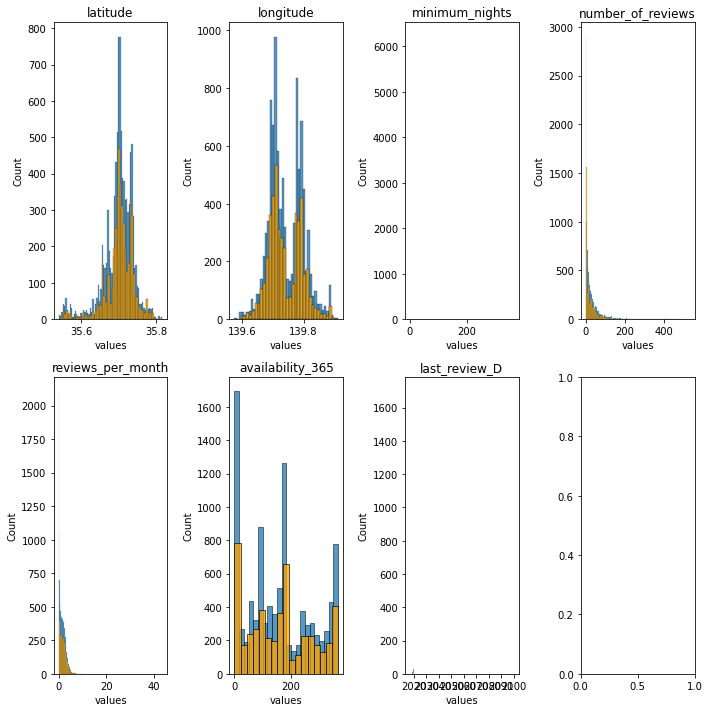

In [99]:
#testデータにおいてヒストグラムを見てみる
fig, axes = plt.subplots(2, 4, figsize=(10,10))

for col, ax in zip(colums, axes.ravel()):
    sns.histplot(train, x=train[col], ax=ax)
    sns.histplot(df_min, x=df_min[col], ax=ax, color='orange')
    ax.set_xlabel('values')
    ax.set_title(col)
plt.tight_layout()
plt.show()

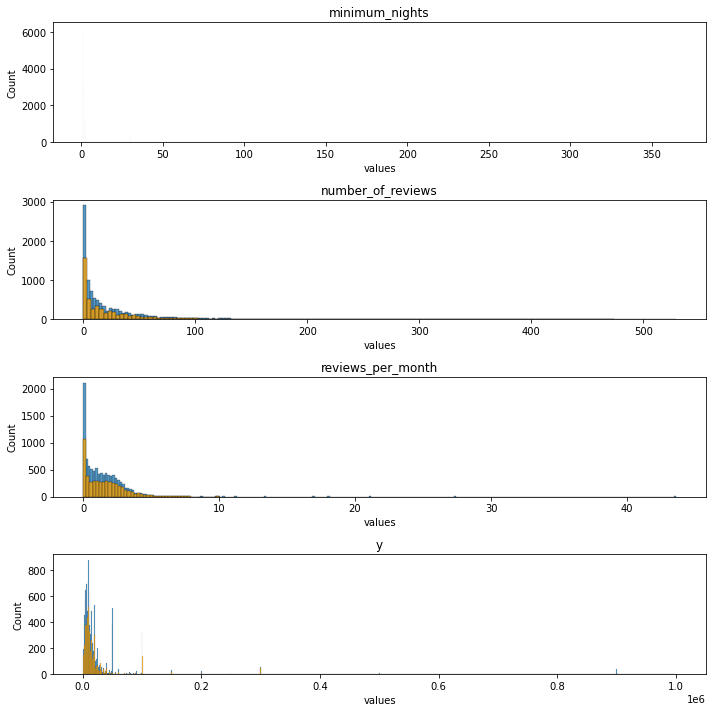

In [100]:
#「外れ値」的なデータが示される特徴量のグラフ
fig, axes = plt.subplots(4, 1, figsize=(10,10))
cols = ['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'y']

for col, ax in zip(cols, axes.ravel()):
    sns.histplot(train, x=train[col], stat='count', ax=ax)
    sns.histplot(df_min, x=df_min[col], stat='count', ax=ax, color='orange')
    ax.set_xlabel('values')
    ax.set_title(col)
plt.tight_layout()
plt.show()

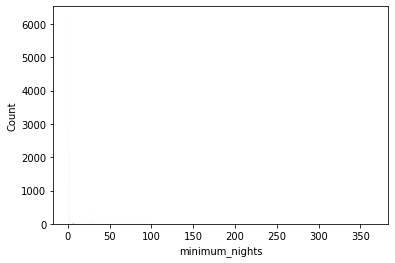

In [101]:
fig = plt.subplots(1,1)

sns.histplot(train.query('minimum_nights < 31'), x=train['minimum_nights'], stat='count')
sns.histplot(df_min.query('minimum_nights < 31'), x=df_min['minimum_nights'], stat='count', color='orange')
plt.show()

In [102]:
len(df_min.query('minimum_nights < 31')), len(df_min)

(4816, 4821)

- 名前にminまたは分とつくデータはほぼすべてが31泊(1か月)以内
- 最寄り駅、宿泊タイプ、閲覧日と評価日の差、年月日の分割、にてラベル付けを行う
- 最寄り駅は、特徴量が膨大になるがひとまずone-hot-encoding
- →最も近い駅を計算によって求める(longnitude/latitudeが最も近い駅でラベル付け)
- 最寄駅からの距離を計算
- 宿泊タイプは1-3日をshort,4-7をweek、8-14をlongstay、15-31をmonthry、32以上をverylongとしてラベル付け
- 閲覧日-評価日で表現
- 年と月と日は分割するか、基準日からの引き算を1000で割って秒単位にする

In [103]:
n_station.reset_index(drop='index', inplace=True)

In [104]:
# 距離を求める
from scipy.spatial import distance

min_dis_tr = []
for i in tqdm.tqdm(range(train.shape[0])):
    L = []
    for s in range(n_station.shape[0]):
        x = (train.loc[i, 'longitude'], train.loc[i, 'latitude'])
        y = (n_station.loc[s, 'longitude'], n_station.loc[s, 'latitude'])
        L.append(distance.euclidean(x, y))
    min_dis_tr.append(np.argmin(L))

100%|██████████| 9990/9990 [04:51<00:00, 34.23it/s]


In [105]:
near_st_tr = []
for i in min_dis_tr:
    near_st_tr.append(n_station.loc[i, 'station_name'])

In [106]:
len(near_st_tr)

9990

In [107]:
train['station_name'] = near_st_tr

In [108]:
train.head()

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D,station_name
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25,清澄白河
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25,入谷
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23,堀切菖蒲園
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02,西新宿五丁目
4,LICENSED SHINJUKU HOUSE: Heart of the action!,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30,東新宿


In [109]:
#テストデータ考える
min_dis_ts = []
for i in tqdm.tqdm(range(test.shape[0])):
    L = []
    for s in range(n_station.shape[0]):
        x = (test.loc[i, 'longitude'], test.loc[i, 'latitude'])
        y = (n_station.loc[s, 'longitude'], n_station.loc[s, 'latitude'])
        L.append(distance.euclidean(x, y))
    min_dis_ts.append(np.argmin(L))

100%|██████████| 4996/4996 [02:25<00:00, 34.29it/s]


In [110]:
near_st_ts = []
for i in min_dis_ts:
    near_st_ts.append(n_station.loc[i, 'station_name'])

In [111]:
near_st_ts

['赤坂',
 '東池袋',
 '下北沢',
 '駒込',
 '入谷',
 '水道橋',
 '梅屋敷',
 '学習院下',
 '秋葉原',
 '高円寺',
 '新大久保',
 '西新井大師西',
 '新江古田',
 '大森',
 '雑色',
 '押上〈スカイツリー前〉',
 '浅草',
 '東新宿',
 '大久保',
 '高輪台',
 '下落合',
 '京急蒲田',
 '大久保',
 '北池袋',
 '新小岩',
 '本郷三丁目',
 '糀谷',
 '新小岩',
 '水天宮前',
 '四谷三丁目',
 '新板橋',
 '広尾',
 '新三河島',
 '新大久保',
 '石川台',
 '千駄木',
 '田原町',
 '新大久保',
 '大久保',
 '三ノ輪',
 '三ノ輪',
 '稲荷町',
 '稲荷町',
 '大久保',
 '京急蒲田',
 '浅草橋',
 '都立家政',
 '北池袋',
 '西新井大師西',
 '田原町',
 '堀切菖蒲園',
 '田原町',
 '新宿御苑前',
 '新小岩',
 '五反野',
 '新日本橋',
 '末広町',
 '新大塚',
 '下北沢',
 '中板橋',
 '京成高砂',
 '神泉',
 '中野新橋',
 '青砥',
 '入谷',
 '新宿三丁目',
 '西武新宿',
 '押上〈スカイツリー前〉',
 '大久保',
 '新大久保',
 '浅草',
 '赤羽',
 '西新宿五丁目',
 '北池袋',
 '水天宮前',
 '西日暮里',
 '大森',
 '浅草',
 '大久保',
 '上町',
 '池袋',
 '千住大橋',
 '本所吾妻橋',
 '上中里',
 '大塚駅前',
 '乃木坂',
 '下落合',
 '十条',
 '浅草',
 '渋谷',
 '渋谷',
 '西新井大師西',
 '板橋',
 '西新宿',
 '西新宿五丁目',
 '江戸川橋',
 '渋谷',
 '赤坂',
 '新御徒町',
 '谷在家',
 '入谷',
 '都立家政',
 '京成立石',
 '三ノ輪',
 '中目黒',
 '入谷',
 '押上〈スカイツリー前〉',
 '平井',
 '浅草',
 '駒込',
 '本所吾妻橋',
 '浅草',
 '東新宿',
 '平井',
 '東新宿',
 '稲荷町',
 '四谷三丁目',
 '南千住',
 '錦糸町',
 

In [112]:
test['station_name'] = near_st_ts

In [113]:
test.head()

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D,station_name
0,"5-minute walk from Akasaka Sta, Superior double",Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01,赤坂
1,7 min Sta.-Center of IKEBUKURO Cozy Room#503,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16,東池袋
2,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12,下北沢
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17,駒込
4,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21,入谷


In [114]:
#テーブルの結合
n_train = pd.merge(train, n_station, how='left', on='station_name')

In [115]:
n_train.head()

,name,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D,station_name,longitude_y,latitude_y
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25,清澄白河,139.798851,35.682105
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25,入谷,139.783924,35.719862
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23,堀切菖蒲園,139.827545,35.747649
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02,西新宿五丁目,139.684304,35.689798
4,LICENSED SHINJUKU HOUSE: Heart of the action!,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30,東新宿,139.707571,35.698418


In [116]:
#最寄り駅との距離を測る
st_dist_tr = []
for i in range(0, len(n_train)):
    x = n_train.loc[i, :]
    t = 6371 * np.arccos(np.cos(x['latitude_x']*np.pi/180) 
                 * np.cos(x['latitude_y']*np.pi/180)
                 * np.cos(x['longitude_y']*np.pi/180 - x['longitude_x']*np.pi/180)
                 + np.sin(x['latitude_x']*np.pi/180) 
                 * np.sin(x['latitude_y']*np.pi/180))
    if np.isnan(t):
        st_dist_tr.append(0)
    else:
        st_dist_tr.append(t)


In [117]:
n_train['st_dist'] = st_dist_tr

In [118]:
n_train.head()

,name,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D,station_name,longitude_y,latitude_y,st_dist
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25,清澄白河,139.798851,35.682105,0.384816
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25,入谷,139.783924,35.719862,0.155237
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23,堀切菖蒲園,139.827545,35.747649,0.368901
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02,西新宿五丁目,139.684304,35.689798,0.664157
4,LICENSED SHINJUKU HOUSE: Heart of the action!,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30,東新宿,139.707571,35.698418,0.261971


In [119]:
#テーブルの結合
n_test = pd.merge(test, n_station, how='left', on='station_name')

In [120]:
n_test.head()

,name,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D,station_name,longitude_y,latitude_y
0,"5-minute walk from Akasaka Sta, Superior double",Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01,赤坂,139.738348,35.673230
1,7 min Sta.-Center of IKEBUKURO Cozy Room#503,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16,東池袋,139.719546,35.725732
2,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12,下北沢,139.667213,35.661597
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17,駒込,139.747248,35.736892
4,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21,入谷,139.783924,35.719862


In [121]:
n_test.shape

(4996, 14)

In [122]:
#最寄り駅との距離を測る
#テストデータ
st_dist_ts = []
for i in range(0, len(n_test)):
    x = n_test.loc[i, :]
    t = 6371 * np.arccos(np.cos(x['latitude_x']*np.pi/180) 
                 * np.cos(x['latitude_y']*np.pi/180)
                 * np.cos(x['longitude_y']*np.pi/180 - x['longitude_x']*np.pi/180)
                 + np.sin(x['latitude_x']*np.pi/180) 
                 * np.sin(x['latitude_y']*np.pi/180))
    if np.isnan(t):
        st_dist_ts.append(0)
    else:
        st_dist_ts.append(t)


In [123]:
st_dist_ts

[0.5405836778764012,
 0.527371143137764,
 0.16792484404423674,
 0.1144288191723719,
 0.16863213503053237,
 0.305956243457676,
 0.6436843677845859,
 0.44350956801732044,
 0.2774463739922968,
 0.5360612370309991,
 0.3448992450703822,
 0.6631317209951821,
 0.21311504855233512,
 0.921147906899491,
 0.730484127763844,
 0.23767349051379538,
 0.23462543939079855,
 0.3699162626429103,
 0.5637918490525963,
 0.4497648890193933,
 0.4120857519492918,
 0.2257635640060151,
 0.35565522380509795,
 0.6098317970743795,
 0.25232473500461355,
 0.32493164256601204,
 0.32373852541596565,
 0.3500850812991816,
 0.14822060516665345,
 0.33909495740995543,
 0.21281061545224178,
 0.6981461132061919,
 0.16216346738366705,
 0.3297647781767036,
 0.180316047400152,
 0.23346971718713322,
 0.1219199887979923,
 0.31144027678461145,
 0.33402924895982267,
 0.148585842803007,
 0.8727977810064432,
 0.4716257187383878,
 0.2650982480765834,
 0.2358492035194839,
 0.38886415873573527,
 0.48782111886772467,
 0.9575315726044057,


In [124]:
n_test['st_dist'] = st_dist_ts

In [125]:
n_test.head()

,name,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D,station_name,longitude_y,latitude_y,st_dist
0,"5-minute walk from Akasaka Sta, Superior double",Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01,赤坂,139.738348,35.673230,0.540584
1,7 min Sta.-Center of IKEBUKURO Cozy Room#503,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16,東池袋,139.719546,35.725732,0.527371
2,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12,下北沢,139.667213,35.661597,0.167925
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17,駒込,139.747248,35.736892,0.114429
4,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21,入谷,139.783924,35.719862,0.168632


In [126]:
np.max(n_train.query('last_review != "2100-01-01"'))
# 2020-04-29が最新日

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/numpy/core/fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


name                 ￮New apartment OPEN!Ikebukuro!WiFi free!2rd fl...
neighbourhood                                               Toshima Ku
latitude_x                                                    35.81595
longitude_x                                                  139.91197
room_type                                                  Shared room
minimum_nights                                                     365
number_of_reviews                                                  529
last_review                                                 2020-04-29
reviews_per_month                                                 43.6
availability_365                                                   365
y                                                              1000103
last_review_D                                      2020-04-29 00:00:00
station_name                                                      麻布十番
longitude_y                                                 139.903698
latitu

In [127]:
np.max(n_test.query('last_review != "2100-01-01"'))
#2020-04-28が最新日

name                 ￬特別限定料金￬★竹乃宿 浅草寺まで徒歩3分/無料WiFi完備 /最寄駅浅草駅/ﾎｯﾋﾟｰ通り
neighbourhood                                             Toshima Ku
latitude_x                                                  35.79707
longitude_x                                                139.90581
room_type                                                Shared room
minimum_nights                                                   365
number_of_reviews                                                407
last_review                                               2020-04-28
reviews_per_month                                               19.7
availability_365                                                 365
last_review_D                                    2020-04-28 00:00:00
station_name                                                    麻布十番
longitude_y                                               139.903698
latitude_y                                                 35.794368
st_dist                           

- 2020-05-01を基準として、そこからの日付の差を見る
- 2100-01-01は0で補完する

In [128]:
#訓練データ

dis_day = []
for i in range(0, len(n_train)):
    if n_train.loc[i, 'last_review'] != '2100-01-01':
        diff = n_train.loc[i, 'last_review_D'] - dt(2020, 5, 1)
        dis_day.append(diff.days)
    else:
        dis_day.append(0)

In [129]:
dis_day

[-6,
 -37,
 -39,
 -29,
 -92,
 -33,
 -16,
 -89,
 -4,
 -96,
 0,
 -36,
 0,
 0,
 -47,
 -54,
 -66,
 -42,
 -190,
 -147,
 -92,
 -26,
 -103,
 -104,
 -159,
 -99,
 -151,
 0,
 0,
 0,
 -102,
 -55,
 0,
 -13,
 -66,
 -6,
 -126,
 -119,
 -178,
 -5,
 -171,
 -85,
 -173,
 0,
 -54,
 -76,
 -77,
 -241,
 -81,
 0,
 -52,
 0,
 -40,
 -49,
 0,
 -78,
 -45,
 -82,
 -61,
 -37,
 -76,
 -26,
 -117,
 -65,
 -77,
 0,
 -60,
 -97,
 -71,
 -79,
 -80,
 -50,
 0,
 0,
 0,
 0,
 0,
 -119,
 -61,
 -86,
 0,
 -48,
 -58,
 -121,
 -45,
 -13,
 -69,
 -102,
 -31,
 -36,
 -62,
 -150,
 0,
 -247,
 0,
 -88,
 -120,
 -73,
 0,
 -72,
 -12,
 -108,
 -51,
 -80,
 -9,
 -12,
 -67,
 -219,
 -127,
 -181,
 -58,
 -16,
 -97,
 -48,
 -334,
 -376,
 0,
 -137,
 -380,
 -70,
 -78,
 -115,
 -38,
 -200,
 -119,
 -132,
 -4,
 -16,
 -71,
 -27,
 -61,
 -45,
 -94,
 -61,
 -94,
 -33,
 -118,
 0,
 0,
 0,
 -116,
 -23,
 -47,
 -33,
 -31,
 -137,
 -66,
 -100,
 -79,
 -427,
 -8,
 -32,
 -210,
 0,
 -56,
 0,
 0,
 -221,
 -100,
 -121,
 -96,
 -26,
 -46,
 0,
 -83,
 -183,
 -80,
 -46,
 -19,
 0,
 -55,

In [130]:
n_train['diffday_from_May1'] = dis_day

In [131]:
n_train.head()

,name,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D,station_name,longitude_y,latitude_y,st_dist,diffday_from_May1
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25,清澄白河,139.798851,35.682105,0.384816,-6
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25,入谷,139.783924,35.719862,0.155237,-37
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23,堀切菖蒲園,139.827545,35.747649,0.368901,-39
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02,西新宿五丁目,139.684304,35.689798,0.664157,-29
4,LICENSED SHINJUKU HOUSE: Heart of the action!,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30,東新宿,139.707571,35.698418,0.261971,-92


In [132]:
#testデータ

dis_day = []
for i in range(0, len(n_test)):
    if n_test.loc[i, 'last_review'] != '2100-01-01':
        diff = n_test.loc[i, 'last_review_D'] - dt(2020, 5, 1)
        dis_day.append(diff.days)
    else:
        dis_day.append(0)

In [133]:
n_test['diffday_from_May1'] = dis_day

In [134]:
n_test.head()

,name,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,last_review_D,station_name,longitude_y,latitude_y,st_dist,diffday_from_May1
0,"5-minute walk from Akasaka Sta, Superior double",Minato Ku,35.67131,139.73285,Private room,1,0,2100-01-01,0.00,183,2100-01-01,赤坂,139.738348,35.673230,0.540584,0
1,7 min Sta.-Center of IKEBUKURO Cozy Room#503,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,2020-04-16,1.94,337,2020-04-16,東池袋,139.719546,35.725732,0.527371,-15
2,Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,2020-02-12,0.82,240,2020-02-12,下北沢,139.667213,35.661597,0.167925,-79
3,Komagome Station 2 minutes on foot,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,2020-02-17,1.19,0,2020-02-17,駒込,139.747248,35.736892,0.114429,-74
4,"Monthly/Metro1min/JR5min/Ueno,Asakusa,Akihabara",Taito Ku,35.72126,139.78320,Entire home/apt,30,2,2019-07-21,0.19,164,2019-07-21,入谷,139.783924,35.719862,0.168632,-285


In [135]:
# targetを分割する
y = n_train.pop('y')

In [136]:
n_train.shape, n_test.shape

((9990, 16), (4996, 16))

In [137]:
#カテゴリ型特徴量の、trainデータとtestデータの片方にしかないデータの確認
non_numeric = [i for i in n_train.columns if n_train[i].dtype == 'object']
dif_col = []
for i in non_numeric:
    x = n_train[i].unique()
    t = n_test[i].unique()
    if set(x) != set(t):
        dif_col.append(i)

In [138]:
# station_nameのみ補完する。nameは後程別の形に変換、last_reviewはdiff_dayで対応したため削除もしくは年月日を分解予定
dif_col

['name', 'last_review', 'station_name']

In [139]:
#数が多くよくわからないため、nameの分割や日付の削除後に対応
for i in dif_col:
    print('trainとtestの違い')
    print(n_train[i].unique())
    print(n_test[i].unique())

trainとtestの違い
['KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tree102'
 'Downtown Tokyo Iriya next to Ueno'
 'Japan Style,Private,Affordable,4min to Sta.' ...
 'Hostel just 5 min from Sta./4 bed room with bath'
 'SHITARA HOUSE dormitory B'
 '【3 rooms/9 pax】Japanese Modern Style/WiFi/Hikihune']
['5-minute walk from Akasaka Sta, Superior double'
 '7 min Sta.-Center of IKEBUKURO Cozy Room#503'
 "Designer'sApt 1min sta☆Shinjuku 7min☆Shibuya 4min" ...
 'A convenient room! 〜SHINJUKU〜 【Pocket WiFi】'
 'Shinjuku ShareHouse Dormitory1  with Balcony'
 '3mins->Shinjuku Gyoenmae Sta/Standard Twin Room']
trainとtestの違い
['2020-04-25' '2020-03-25' '2020-03-23' '2020-04-02' '2020-01-30'
 '2020-03-29' '2020-04-15' '2020-02-02' '2020-04-27' '2020-01-26'
 '2100-01-01' '2020-03-26' '2020-03-15' '2020-03-08' '2020-02-25'
 '2020-03-20' '2019-10-24' '2019-12-06' '2020-04-05' '2020-01-19'
 '2020-01-18' '2019-11-24' '2020-01-23' '2019-12-02' '2020-01-20'
 '2020-03-07' '2020-04-18' '2019-12-27' '2020-01-03' '2019-11

In [140]:
#name,日付を退避させる
tr_name = n_train.pop('name')
ts_name = n_test.pop('name')
tr_day = n_train.pop('last_review')
ts_day = n_test.pop('last_review')

In [141]:
#datetime型に変換した日付を削除
n_train.pop('last_review_D')
n_test.pop('last_review_D')

0      2100-01-01
1      2020-04-16
2      2020-02-12
3      2020-02-17
4      2019-07-21
          ...    
4991   2019-12-15
4992   2018-08-25
4993   2020-03-14
4994   2020-01-01
4995   2100-01-01
Name: last_review_D, Length: 4996, dtype: datetime64[ns]

In [142]:
n_train.shape, n_test.shape

((9990, 13), (4996, 13))

In [143]:
n_train.head()

,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,reviews_per_month,availability_365,station_name,longitude_y,latitude_y,st_dist,diffday_from_May1
0,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2.21,173,清澄白河,139.798851,35.682105,0.384816,-6
1,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2.11,9,入谷,139.783924,35.719862,0.155237,-37
2,Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,3.46,288,堀切菖蒲園,139.827545,35.747649,0.368901,-39
3,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,1.76,87,西新宿五丁目,139.684304,35.689798,0.664157,-29
4,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2.00,156,東新宿,139.707571,35.698418,0.261971,-92


In [144]:
n_test.head()

,neighbourhood,latitude_x,longitude_x,room_type,minimum_nights,number_of_reviews,reviews_per_month,availability_365,station_name,longitude_y,latitude_y,st_dist,diffday_from_May1
0,Minato Ku,35.67131,139.73285,Private room,1,0,0.00,183,赤坂,139.738348,35.673230,0.540584,0
1,Toshima Ku,35.73014,139.71739,Entire home/apt,2,21,1.94,337,東池袋,139.719546,35.725732,0.527371,-15
2,Setagaya Ku,35.66193,139.66540,Entire home/apt,1,14,0.82,240,下北沢,139.667213,35.661597,0.167925,-79
3,Toshima Ku,35.73603,139.74794,Entire home/apt,1,16,1.19,0,駒込,139.747248,35.736892,0.114429,-74
4,Taito Ku,35.72126,139.78320,Entire home/apt,30,2,0.19,164,入谷,139.783924,35.719862,0.168632,-285


In [145]:
#テーブルデータの複製
df_train = n_train.copy()
df_test = n_test.copy()

In [146]:
# #station_nameは差が膨大のため退避
# stname_tr = df_train.pop('station_name')
# stname_ts = df_test.pop('station_name')

In [147]:
#ダミー変数化
category = [i for i in df_train.columns if df_train[i].dtype == 'object']
df_train = pd.get_dummies(df_train, columns=category)
df_test = pd.get_dummies(df_test, columns=category)

In [148]:
df_train.shape, df_test.shape

((9990, 446), (4996, 374))

In [149]:
#testデータにない列名を探索
dif_ls = []
for i in df_train.columns:
    if i not in df_test.columns:
        dif_ls.append(i)

In [150]:
dif_ls

['station_name_三ノ輪橋',
 'station_name_上井草',
 'station_name_上北沢',
 'station_name_上板橋',
 'station_name_上野御徒町',
 'station_name_下井草',
 'station_name_不動前',
 'station_name_世田谷',
 'station_name_中延',
 'station_name_中村橋',
 'station_name_久が原',
 'station_name_九品仏',
 'station_name_九段下',
 'station_name_京成関屋',
 'station_name_代々木八幡',
 'station_name_光が丘',
 'station_name_八幡山',
 'station_name_六町',
 'station_name_勝どき',
 'station_name_北千束',
 'station_name_北赤羽',
 'station_name_千鳥町',
 'station_name_南砂町',
 'station_name_地下鉄成増',
 'station_name_大崎',
 'station_name_大手町',
 'station_name_大森海岸',
 'station_name_大泉学園',
 'station_name_天王洲アイル',
 'station_name_奥沢',
 'station_name_富士見台',
 'station_name_小台',
 'station_name_小菅',
 'station_name_山下',
 'station_name_御嶽山',
 'station_name_志村三丁目',
 'station_name_志村坂上',
 'station_name_成増',
 'station_name_新柴又',
 'station_name_新桜台',
 'station_name_新橋',
 'station_name_旗の台',
 'station_name_日比谷',
 'station_name_明大前',
 'station_name_木場',
 'station_name_本駒込',
 'station_name_東京',
 'stati

In [151]:
#testデータに0で埋めたリストを追加
for i in dif_ls:
    df_test[i] = [0] * len(df_test)

In [152]:
df_train.shape, df_test.shape

((9990, 446), (4996, 469))

In [153]:
#trainデータにない列名を探索
dif_ls = []
for i in df_test.columns:
    if i not in df_train.columns:
        dif_ls.append(i)

In [154]:
dif_ls

['station_name_上石神井',
 'station_name_上野毛',
 'station_name_下赤塚',
 'station_name_二子玉川',
 'station_name_仙川',
 'station_name_北綾瀬',
 'station_name_原宿',
 'station_name_堀切',
 'station_name_学芸大学',
 'station_name_宮の坂',
 'station_name_富士見ヶ丘',
 'station_name_新宿',
 'station_name_東大前',
 'station_name_溜池山王',
 'station_name_潮見',
 'station_name_白山',
 'station_name_緑が丘',
 'station_name_荒川区役所前',
 'station_name_西ケ原',
 'station_name_西大島',
 'station_name_豪徳寺',
 'station_name_青井',
 'station_name_高輪ゲートウェイ']

In [155]:
#trainデータに0で埋めたリストを追加
for i in dif_ls:
    df_train[i] = [0] * len(df_train)

In [156]:
df_train.shape, df_test.shape

((9990, 469), (4996, 469))

## ベースラインモデルの作成・評価

### 行った処理
- 最寄り駅の追加
- 最寄駅からの距離追加
- 2020年5月1日基準として、最終閲覧日からの日数の差
- room_type, station_nameのダミー変数化
- 最寄り駅が複数ある場合、緯度経度を平均して一つにまとめる
- 最寄り駅の緯度経度の追加

In [157]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import lightgbm as lgb
import xgboost as xgb
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_log_error

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [158]:
# #標準化
# scaler = StandardScaler()
# scaler.fit(df_train)
# train_scaled = scaler.transform(df_train)

# #訓練データの分割
# X_train, X_test, y_train, y_test = train_test_split(train_scaled, y, test_size=0.2, random_state=100)

# #ロジスティック回帰モデルの学習
# logreg = LogisticRegression()
# logreg.fit(X_train, y_train)

# pred = logreg.predict(X_test)


In [159]:
# #ロジスティック回帰の対数平均平方二乗誤差 (RMSLE)の評価
# rmsle = np.sqrt(mean_squared_log_error(y_true=y_test, y_pred=pred))
# print(rmsle)

In [160]:
#ランダムフォレストモデルの学習
#標準化
scaler = StandardScaler()
scaler.fit(df_train)
train_scaled = scaler.transform(df_train)

#訓練データの分割
X_train, X_test, y_train, y_test = train_test_split(train_scaled, y, test_size=0.2, random_state=100)

rf = RandomForestRegressor(n_estimators=150)
rf.fit(X_train, y_train)

m_pred = rf.predict(X_test)

In [161]:
#ランダムフォレスト回帰の対数平均平方二乗誤差 (RMSLE)の評価
rmsle = np.sqrt(mean_squared_log_error(y_true=y_test, y_pred=m_pred))
print(rmsle)

0.7712654282960547


# 特徴量選択

- 価格の分布をQ-Qプロットで見てみる

((array([-3.81036211, -3.58519648, -3.46157853, ...,  3.46157853,
          3.58519648,  3.81036211]),
  array([    921,    1085,    1106, ...,  983382,  999961, 1000103])),
 (33103.8429047514, 25104.643043043037, 0.4935677659120725))

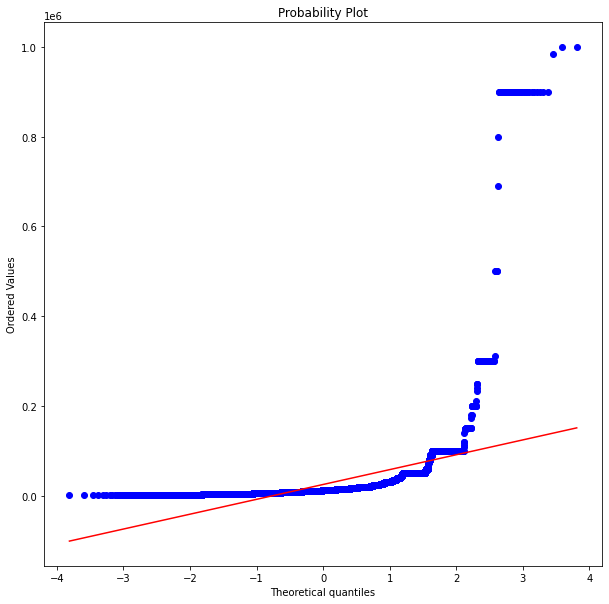

In [162]:
from scipy import stats

fig, axes = plt.subplots(1,1,figsize=(10,10))

stats.probplot(y, plot=axes)

In [163]:
y.describe()

count    9.990000e+03
mean     2.510464e+04
std      6.704985e+04
min      9.210000e+02
25%      6.960750e+03
50%      1.189250e+04
75%      2.008500e+04
max      1.000103e+06
Name: y, dtype: float64

In [164]:
# yの値を対数変換してみる
y_log = np.log1p(y)
y_log

0        9.393412
1        8.805075
2        9.202711
3        9.000853
4       11.516828
          ...    
9985     9.510889
9986     8.095599
9987     9.609049
9988     8.281724
9989    10.715351
Name: y, Length: 9990, dtype: float64

In [165]:
#ランダムフォレストモデルの学習
#標準化
scaler = StandardScaler()
scaler.fit(df_train)
train_scaled = scaler.transform(df_train)

#訓練データの分割
X_train, X_test, y_train, y_test = train_test_split(train_scaled, y_log, test_size=0.2, random_state=100)

rf = RandomForestRegressor(n_estimators=150)
rf.fit(X_train, y_train)

m_pred = rf.predict(X_test)

In [166]:
#ランダムフォレスト回帰の対数平均平方二乗誤差 (RMSLE)の評価
rmsle = np.sqrt(mean_squared_log_error(y_true=y_test, y_pred=m_pred))
print(rmsle)

0.05703981304990758


In [167]:
#testデータでsubmitまで行う
scaler = StandardScaler()
scaler.fit(df_test)
T_scaled = scaler.transform(df_test)

T_pred = np.exp(rf.predict(T_scaled))

In [168]:
T_id = test_ids['id']
target = pd.DataFrame({'y':T_pred})
df_model = pd.concat([T_id, target], axis=1)
df_model.to_csv('submission.csv', index=False)

In [169]:
#lightgbmモデルの学習
scores = []
aucs = []
pred_lgbs = []
kf = KFold(n_splits=4, shuffle=True, random_state=0)
for tr_idx, va_idx in kf.split(df_train):
    tr_x, va_x = df_train.iloc[tr_idx], df_train.iloc[va_idx]
    tr_y, va_y = y_log.iloc[tr_idx], y_log.iloc[va_idx]
    
    lgb_train = lgb.Dataset(tr_x, tr_y)
    lgb_eval = lgb.Dataset(va_x, va_y)
    
    params = {'objective': 'rmse', 'seed': 0, 'verbose': -1, 'metrics': 'rmse', 'early_stopping':5000}
    num_round = 10000
    
    model = lgb.train(params, lgb_train, num_boost_round=num_round,
                      valid_names=['train','valid'], valid_sets=[lgb_train, lgb_eval])
    va_pred = model.predict(va_x)
    rmsle = np.sqrt(mean_squared_log_error(y_true=va_y, y_pred=va_pred))
    print(f'rmsle: {rmsle:.4f}')
    pred_lgb = model.predict(df_test)
    pred_lgbs.append(pred_lgb)

[1]	train's rmse: 0.946021	valid's rmse: 0.952009
Training until validation scores don't improve for 5000 rounds
[2]	train's rmse: 0.918472	valid's rmse: 0.928619
[3]	train's rmse: 0.89539	valid's rmse: 0.908976
[4]	train's rmse: 0.875774	valid's rmse: 0.891636
[5]	train's rmse: 0.857601	valid's rmse: 0.875491
[6]	train's rmse: 0.842169	valid's rmse: 0.862626
[7]	train's rmse: 0.827873	valid's rmse: 0.849681
[8]	train's rmse: 0.815654	valid's rmse: 0.84006
[9]	train's rmse: 0.805303	valid's rmse: 0.831106
[10]	train's rmse: 0.795049	valid's rmse: 0.823071
[11]	train's rmse: 0.785596	valid's rmse: 0.81559
[12]	train's rmse: 0.777129	valid's rmse: 0.809809
[13]	train's rmse: 0.771088	valid's rmse: 0.805141
[14]	train's rmse: 0.764946	valid's rmse: 0.799851
[15]	train's rmse: 0.757958	valid's rmse: 0.794579
[16]	train's rmse: 0.751887	valid's rmse: 0.791035
[17]	train's rmse: 0.746808	valid's rmse: 0.786648
[18]	train's rmse: 0.742248	valid's rmse: 0.782893
[19]	train's rmse: 0.736864	val

In [170]:
pred_lgbs

[array([9.75087986, 8.87459915, 9.48975599, ..., 9.46749677, 8.37648323,
        9.22162412]),
 array([9.57094586, 9.58256915, 9.61163318, ..., 9.44157607, 8.23804887,
        9.1088815 ]),
 array([9.85253836, 9.55186738, 9.28864766, ..., 9.58197016, 8.15356986,
        9.71278934]),
 array([9.21997316, 9.46475912, 9.50824071, ..., 9.50931472, 8.28353799,
        9.10442818])]

In [171]:
#lightgbmのバリデーションの回数(4回)におけるテストデータ予測値を平均
lgb_prediction = pd.DataFrame()
for i, pred in enumerate(pred_lgbs):
    lgb_prediction['pred_'+str(i)] = pred

In [172]:
#lightgbmのバリデーションの回数(4回)におけるテストデータ予測値を平均
mean_pred_lgb = pd.DataFrame()
for i in tqdm.tqdm(range(0, lgb_prediction.shape[0])):
    mean_pred_lgb.loc[i,'y'] = lgb_prediction.loc[i, :].mean()

100%|██████████| 4996/4996 [00:02<00:00, 1833.01it/s]


In [173]:
T_id = test_ids['id']
lgb_pred = np.exp(mean_pred_lgb)
df_model = pd.concat([T_id, lgb_pred], axis=1)
df_model.to_csv('submission.csv', index=False)

- 予測対象(料金)の対数変換によりスコア改善
- しかし、randomforestとlightgbm(勾配ブｰスティング選択、繰り返し5000回)の差は見られなかった
- 次に行うのは、
- minimum_nightsに対してフラグ付け(1-3：short, 4-7:week, 8-14:2week, 15-31:month, 32~:and_more),列に追加→理由は顧客の利用意図を分割するため
- データのクラスタリング(23個)→理由は23区の情報のためエリア情報的なものを追加したい考え。trainとtestで共通にしたいため、駅名データのみで作成するか？
- 名前データからの情報抽出(new,open,saleなど)し、フラグ付け→理由はnameから抽出できる数値以外の情報を抽出したいため
- 日付情報の復活(年月日を分割して列に追加)

In [174]:
df_train.head()

,latitude_x,longitude_x,minimum_nights,number_of_reviews,reviews_per_month,availability_365,longitude_y,latitude_y,st_dist,diffday_from_May1,neighbourhood_Adachi Ku,neighbourhood_Arakawa Ku,neighbourhood_Bunkyo Ku,neighbourhood_Chiyoda Ku,neighbourhood_Chuo Ku,neighbourhood_Edogawa Ku,neighbourhood_Itabashi Ku,neighbourhood_Katsushika Ku,neighbourhood_Kita Ku,neighbourhood_Koto Ku,neighbourhood_Meguro Ku,neighbourhood_Minato Ku,neighbourhood_Nakano Ku,neighbourhood_Nerima Ku,neighbourhood_Ota Ku,neighbourhood_Setagaya Ku,neighbourhood_Shibuya Ku,neighbourhood_Shinagawa Ku,neighbourhood_Shinjuku Ku,neighbourhood_Suginami Ku,neighbourhood_Sumida Ku,neighbourhood_Taito Ku,neighbourhood_Toshima Ku,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,station_name_お花茶屋,station_name_とうきょうスカイツリー,station_name_ときわ台,station_name_一之江,station_name_三ノ輪,station_name_三ノ輪橋,station_name_三河島,station_name_三田,station_name_三越前,station_name_三軒茶屋,station_name_上中里,station_name_上井草,station_name_上北沢,station_name_上板橋,station_name_上町,station_name_上野,station_name_上野広小路,station_name_上野御徒町,station_name_下丸子,station_name_下井草,station_name_下北沢,station_name_下板橋,station_name_下神明,station_name_下落合,station_name_下高井戸,station_name_不動前,station_name_世田谷,station_name_世田谷代田,station_name_両国,station_name_中井,station_name_中延,station_name_中村橋,station_name_中板橋,station_name_中目黒,station_name_中野,station_name_中野坂上,station_name_中野富士見町,station_name_中野新橋,station_name_乃木坂,station_name_久が原,station_name_久我山,station_name_九品仏,station_name_九段下,station_name_亀戸,station_name_亀戸水神,station_name_亀有,station_name_五反田,station_name_五反野,station_name_井荻,station_name_京急蒲田,station_name_京成上野,station_name_京成小岩,station_name_京成曳舟,station_name_京成立石,station_name_京成金町,station_name_京成関屋,station_name_京成高砂,station_name_人形町,station_name_代々木,station_name_代々木上原,station_name_代々木八幡,station_name_代々木公園,station_name_代官山,...,station_name_落合南長崎,station_name_葛西,station_name_蒲田,station_name_蓮根,station_name_蓮沼,station_name_蔵前,station_name_虎ノ門,station_name_表参道,station_name_西ヶ原四丁目,station_name_西台,station_name_西大井,station_name_西太子堂,station_name_西小山,station_name_西巣鴨,station_name_西新井,station_name_西新井大師西,station_name_西新宿,station_name_西新宿五丁目,station_name_西日暮里,station_name_西早稲田,station_name_西武新宿,station_name_西永福,station_name_西荻窪,station_name_西葛西,station_name_西馬込,station_name_西高島平,station_name_要町,station_name_見沼代親水公園,station_name_護国寺,station_name_谷在家,station_name_豊島園,station_name_豊洲,station_name_赤土小学校前,station_name_赤坂,station_name_赤坂見附,station_name_赤羽,station_name_赤羽岩淵,station_name_赤羽橋,station_name_越中島,station_name_都庁前,station_name_都立大学,station_name_都立家政,station_name_都電雑司ヶ谷,station_name_野方,station_name_金町,station_name_銀座,station_name_銀座一丁目,station_name_錦糸町,station_name_鐘ヶ淵,station_name_門前仲町,station_name_阿佐ケ谷,station_name_雑司が谷,station_name_雑色,station_name_雪が谷大塚,station_name_青山一丁目,station_name_青物横丁,station_name_青砥,station_name_面影橋,station_name_飛鳥山,station_name_飯田橋,station_name_馬喰横山,station_name_馬喰町,station_name_馬込,station_name_駒場東大前,station_name_駒沢大学,station_name_駒込,station_name_高井戸,station_name_高円寺,station_name_高島平,station_name_高田馬場,station_name_高輪台,station_name_高野,station_name_鬼子母神前,station_name_鮫洲,station_name_鶯谷,station_name_鷺ノ宮,station_name_麻布十番,station_name_上石神井,station_name_上野毛,station_name_下赤塚,station_name_二子玉川,station_name_仙川,station_name_北綾瀬,station_name_原宿,station_name_堀切,station_name_学芸大学,station_name_宮の坂,station_name_富士見ヶ丘,station_name_新宿,station_name_東大前,station_name_溜池山王,station_name_潮見,station_name_白山,station_name_緑が丘,station_name_荒川区役所前,station_name_西ケ原,station_name_西大島,station_name_豪徳寺,station_name_青井,station_name_高輪ゲートウェイ
0,35.68185,139.80310,1,55,2.21,173,139.798851,35.682105,0.384816,-6,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [175]:
# #ベースラインデータのコピー
# sel_train = df_train.copy()
# sel_test = df_test.copy()

In [176]:
# sel_train.loc[0, 'minimum_nights']

In [177]:
# #trainデータ
# for i in range(len(sel_train)):
#     p = sel_train.loc[i, 'minimum_nights']
#     if 1 <= p and p <= 3:
#         sel_train.loc[i, 'short'] = 1
#     elif 4 <= p and p <= 7:
#         sel_train.loc[i, 'weekly'] = 1
#     elif 8 <= p and p <= 14:
#         sel_train.loc[i, '2weekly'] = 1
#     elif 15 <= p and p <= 31:
#         sel_train.loc[i, 'monthly'] = 1
#     elif 32 <= p:
#         sel_train.loc[i, 'and_more'] = 1
# sel_train = sel_train.fillna(0)

In [178]:
# sel_train.head()

In [179]:
# #testデータ
# for i in range(len(sel_test)):
#     p = sel_test.loc[i, 'minimum_nights']
#     if 1 <= p and p <= 3:
#         sel_test.loc[i, 'short'] = 1
#     elif 4 <= p and p <= 7:
#         sel_test.loc[i, 'weekly'] = 1
#     elif 8 <= p and p <= 14:
#         sel_test.loc[i, '2weekly'] = 1
#     elif 15 <= p and p <= 31:
#         sel_test.loc[i, 'monthly'] = 1
#     elif 32 <= p:
#         sel_test.loc[i, 'and_more'] = 1
# sel_test = sel_test.fillna(0)

In [180]:
# sel_test.head()

In [181]:
sing_tmp

,station_name,longitude,latitude
0,御成門,139.751535,35.661215
1,後楽園,139.751864,35.707898
2,桜田門,139.751490,35.677405
3,霞ケ関,139.750899,35.673838
4,昭和島,139.749918,35.570656
...,...,...,...
574,八幡山,139.614927,35.669982
575,高井戸,139.615115,35.683253
576,上北沢,139.623290,35.668857
577,下井草,139.624688,35.723852


In [182]:
st_mean

,station_name,longitude,latitude
0,池袋,139.710321,35.730268
1,渋谷,139.701535,35.658840
2,新宿,139.699750,35.690473
3,大手町,139.764550,35.685847
4,北千住,139.804951,35.749493
5,浅草,139.796291,35.711473
6,飯田橋,139.744949,35.702105
7,新橋,139.759028,35.666177
8,日比谷,139.759633,35.674956
9,五反田,139.724057,35.626113


In [183]:
len(sing_tmp), len(st_mean)

(579, 70)

In [184]:
len(station)

746

In [185]:
mean_station = pd.concat([st_mean, sing_tmp])

In [186]:
mean_station

,station_name,longitude,latitude
0,池袋,139.710321,35.730268
1,渋谷,139.701535,35.658840
2,新宿,139.699750,35.690473
3,大手町,139.764550,35.685847
4,北千住,139.804951,35.749493
...,...,...,...
574,八幡山,139.614927,35.669982
575,高井戸,139.615115,35.683253
576,上北沢,139.623290,35.668857
577,下井草,139.624688,35.723852


In [187]:
# #凝集的階層型クラスタリングを試す
# #23分割が良いのかどうか
# from scipy.cluster.hierarchy import linkage, dendrogram
# from sklearn.preprocessing import StandardScaler

# fig, axes = plt.subplots(1,1,figsize=(10,10))

# scaler = StandardScaler()
# scaler.fit(mean_station[['longitude','latitude']])
# X_scaled = scaler.transform(mean_station[['longitude','latitude']])
# result = linkage(X_scaled, method='ward')
# dend = dendrogram(result, ax=axes)


- デンドログラムより、クラスタ数8つで分割するのがいいか

In [188]:
# # 階層的クラスタリングを、クラスタ数8で行う
# #ユークリッド距離をward法によって分割
# from sklearn.cluster import AgglomerativeClustering

# clust = AgglomerativeClustering(n_clusters = 8, affinity = 'euclidean', linkage = 'ward')
# pr_clust = clust.fit_predict(mean_station[['longitude','latitude']])

In [189]:
# mean_station['station_cluster'] =  pr_clust

In [190]:
# mean_station

In [191]:
# mean_station.reset_index(drop='index', inplace=True)

In [192]:
# #訓練データのクラスタリング
# for i in range(len(sel_train)):
#     sn_x = n_train.loc[i, 'station_name']
#     for s, n in enumerate(mean_station['station_name']):
#         if sn_x == n:
#             sel_train.loc[i, 'area_cluster'] = mean_station.loc[s, 'station_cluster']

In [193]:
# sel_train

In [194]:
# #testデータのクラスタリング
# for i in range(len(sel_test)):
#     sn_x = n_test.loc[i, 'station_name']
#     for s, n in enumerate(mean_station['station_name']):
#         if sn_x == n:
#             sel_test.loc[i, 'area_cluster'] = mean_station.loc[s, 'station_cluster']

In [195]:
# sel_test.head()

In [196]:
#trainデータでnameにnewなどの情報あるものは1
search_n = tr_name.str.contains('new|NEW|New|open|Open|OPEN|sale|Sale|SALE')
for i, e in enumerate(search_n):
    if e == True:
        sel_train.loc[i, 'info_new'] = 1
sel_train = sel_train.fillna(0)


NameError: name 'sel_train' is not defined

In [ ]:
# sel_train.head()

In [ ]:
# #testデータでnameにnewなどの情報あるものは1
# search_s = ts_name.str.contains('new|NEW|New|open|Open|OPEN|sale|Sale|SALE')
# for i, e in enumerate(search_s):
#     if e == True:
#         sel_test.loc[i, 'info_new'] = 1
# sel_test = sel_test.fillna(0)


In [ ]:
# sel_train.shape, sel_test.shape

- 以下を行いランダムフォレストで学習
- minimum_nightsに対してフラグ付け(1-3：short, 4-7:week, 8-14:2week, 15-31:month, 32~:and_more),列に追加→理由は顧客の利用意図を分割するため
- データのクラスタリング(23個)→理由は23区の情報のためエリア情報的なものを追加したい考え。trainとtestで共通にしたいため、駅名データのみで作成するか？
- 名前データからの情報抽出(new,open,saleなど)し、フラグ付け→理由はnameから抽出できる数値以外の情報を抽出したいため
- 日付情報の復活(年月日を分割して列に追加)
- すべて追加したモデルはスコア悪化

- 追加した特徴量のそれぞれで効果を確かめる
- ベースラインモデルのrmsle:train 0.05677496447916764
- 滞在日数フラグのみは悪化
- 駅名クラスタリングのみも悪化
- newなどの情報を足したものも悪化
- 駅の座標longitude_yなど削除しても悪化
- 日付を単純に分割しただけでは精度変わらず
- 日付をunix時間にしたものを追加しても改善せず
- 日付をunix時間にして2020年5月1日からの差を算出して足しても改善せず
- カテゴリ変数のlabelencodingを行っても改善せず
- hostidを追加したら改善,対数変換をしたら悪化したため、対数変換はしない
- label encodingを行い,host_idを加えた勾配ブｰスティングを試してみる→勾配ブｰスティング自体の計算はでき,testデータに対するrmsleはhost_idを加えることで改善したが、submmitは悪化した
- 駅とホテルのマンハッタン距離、方位角度、中間点を足す→ランダムフォレストではほぼ効果なし
- マンハッタン距離：(x1, y1)、(x2, y2)としてD=|x1-x2|+|y1-y2|
- 方位角度：(x1, y1)、(x2, y2)として90 - arctan2(sinΔx, cosy1tany2-siny1cosΔx)  ,Δx=x2-x1, arctan2(x, y)=arctan(y/x)
- 中間点：(x1+x2)/2, (y1+y2)/2
- 月のコメント数：number_of_reviews/reviews_per_monthカラムの追加→悪化
- 月のコメント数：number_of_reviews*reviews_per_monthカラムの追加→悪化
- tf-idfによりnameから単語の重要度(=珍しさ)を計算する→まずは漢字か英数字かのフラグ付け

In [200]:
train.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [201]:
test.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [202]:
train.head()

,name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,availability_365,y,last_review_D,station_name
0,KiyosumiShirakawa 3min|★SkyTree★|WIFI|Max4|Tre...,Koto Ku,35.68185,139.80310,Entire home/apt,1,55,2020-04-25,2.21,173,12008,2020-04-25,清澄白河
1,Downtown Tokyo Iriya next to Ueno,Taito Ku,35.72063,139.78536,Entire home/apt,6,72,2020-03-25,2.11,9,6667,2020-03-25,入谷
2,"Japan Style,Private,Affordable,4min to Sta.",Katsushika Ku,35.74723,139.82349,Entire home/apt,1,18,2020-03-23,3.46,288,9923,2020-03-23,堀切菖蒲園
3,4 min to Shinjuku Sta. by train / 2 ppl / Wi-fi,Shibuya Ku,35.68456,139.68077,Entire home/apt,1,2,2020-04-02,1.76,87,8109,2020-04-02,西新宿五丁目
4,LICENSED SHINJUKU HOUSE: Heart of the action!,Shinjuku Ku,35.69840,139.70467,Entire home/apt,1,86,2020-01-30,2.00,156,100390,2020-01-30,東新宿


In [203]:
import re
import regex
tr_name = train['name']
ts_name = test['name']

In [204]:
def check_kanji(data):
    # 小文字に変換
    name_list = []
    for i, v in enumerate(data):
        data[i] = v.lower()
    
    # 特殊な文字を半角スペースに変換
    for v in data:
        name_list.append(re.sub(',|/|\|-|<|>|☆|★|[|]|✣|･|♦|❤|&|▶|▼|☀️|●|◆|✤|✦|▲|◎', ' ', v))
    
    ch_name = pd.DataFrame({'name':name_list})
    
    # 漢字が含まれているのにフラグ付け
    for i in range(len(ch_name)):
        val = ch_name.loc[i, 'name']
        if not regex.findall(r'\p{Han}+',val):
            ch_name.loc[i, 'english'] = 1
            ch_name.loc[i, 'kanji'] = 0
        else:
            ch_name.loc[i, 'english'] = 0
            ch_name.loc[i, 'kanji'] = 1
    
    # float -> intの変換
    for i in range(len(ch_name)):
        ch_name['english'][i] = int(ch_name['english'][i])
        ch_name['kanji'][i] = int(ch_name['kanji'][i])
    return ch_name
    

In [205]:
ch_name_tr = check_kanji(tr_name)
ch_name_tr.head(100)

,name,english,kanji
0,kiyosumishirakawa 3min skytree wifi max4 tre...,1.0,0.0
1,downtown tokyo iriya next to ueno,1.0,0.0
2,japan style private affordable 4min to sta.,1.0,0.0
3,4 min to shinjuku sta. by train 2 ppl wi-fi,1.0,0.0
4,licensed shinjuku house: heart of the action!,1.0,0.0
5,quiet residential shinjuku area 8 min on foot sta,1.0,0.0
6,5mins walk to sta. familymat double room liuqm1,1.0,0.0
7,花川戸(竹)池袋から600米高端民宿(空港送迎ｻｰﾋﾞｽあり),0.0,1.0
8,东京精品民宿5 近新宿､渋谷､池袋､銀座､秋葉原､上野,0.0,1.0
9,【2 f】asakusabashi building for 6-9 ppl,1.0,0.0


In [206]:
a = int(ch_name_tr['english'][0])
type(a)

int

In [207]:
ch_name_ts = check_kanji(ts_name)
ch_name_ts.head(100)

,name,english,kanji
0,5-minute walk from akasaka sta superior double,1.0,0.0
1,7 min sta.-center of ikebukuro cozy room#503,1.0,0.0
2,designer'sapt 1min sta shinjuku 7min shibuya 4min,1.0,0.0
3,komagome station 2 minutes on foot,1.0,0.0
4,monthly metro1min jr5min ueno asakusa akihabara,1.0,0.0
5,6min- jrsuidobashi sta twin nosmoke nomeal,1.0,0.0
6,(2 rooms) 8mins to haneda shinagawa and yokohama,1.0,0.0
7,6min station*shinjuku(新宿) comfy private wifi...,0.0,1.0
8,akihabara♪ueno♪3min♪anime♪electric town!,1.0,0.0
9,很酷男生在这里,0.0,1.0


In [208]:
len(ch_name_ts.query('kanji==1'))/len(ch_name_ts)

0.188951160928743

In [209]:
#tf-idfによる文字の分析を行う
from sklearn.feature_extraction.text import TfidfVectorizer

tr_words = np.array(ch_name_tr.query('english==1')['name'])

vec_tfidf = TfidfVectorizer()
V = vec_tfidf.fit_transform(tr_words)

tfidf_df = pd.DataFrame(V.toarray(), index=ch_name_tr.query('english==1')['name'], columns=vec_tfidf.get_feature_names())

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [210]:
tfidf_df

,00,001,002,003,004,007,01,02,03,033,04,043akihabara,05,06,07,08,09,0min,0open,0opensale,0shinjuku,10,100,1001,1002,1003,1004,100inch,100m,100m2,100m²,100sq,101,101a,101c,101new,101sqm,102,102new,103,103comfy,104,105,106,107,108,109,10a,10am,10b,10bed,10beds,10f,10m,10min,10mina,10minamiaoyamaguesthouse,10minb,10minhanedaairport,10mins,10minute,10ms,10p,10pax,10paxhouse,10people,10pp,10ppl,10sec,10sqm,10분,11,110,110m2,111,11a,11beds,11f,11min,11mins,11p,11pax,11ppl,11ppls,11분,12,120,1201,1202a,120sqm,125,128,12bedroom,12beds,12guests,12min,12minsaakiha,12minshibuya,12pax,12ppl,...,yoshihisa,yotsugi,yotsuya,yotugi,you,your,yours,youth,youtube,yoy,yoyogi,yoyogi4min,yoyogi_koen,yoyogipark,yoyogipark7,yoyogishibuyaarea,yoyogista,ysob,yu,yukata,yuki,yumeji,yumi,yummy,yururi,yushima,yutaka,yuuntei,yuyukan,yyoe,z11,z3,z4,za,zaito,zen,zo,zoo,zoshigaya,zsdj3,zt,zuzu,ōkubo,①2sgbed,①unique,②2sgbed,②4min,②ir11,②ir12,②ir13,②unique,③4min,④2dbbed,⑤1dbbed,なごみ,のれん,やすらぎ,객실,거리에,교통편리,까지,다다미방,도보,도보2분,모던,무료,숙박가능,숙소입니다,스카이트리,신오오쿠보,신주쿠,아사쿠사,아파트,오모테산도역,오오쿠보역,용이한,우에노,우에노역,위치한,일본스타일,접근,최대6명,하라주쿠,휴대용wifi제공,ｶﾝﾀｰﾀｳﾞｨﾚｯｼﾞ,ｸｲｰﾝﾍﾞｯﾄﾞﾙｰﾑ,ｺﾛﾅ,ｼﾞｮｰﾝｽﾞ,ｽｰﾍﾟﾘｱ,ｽｲｰﾄﾙｰﾑ,ｽﾀﾝﾀﾞｰﾄﾞﾂｲﾝﾙｰﾑ,ﾀﾞﾌﾞﾙﾙｰﾑ,ﾂｲﾝ,ﾃﾞｻﾞｲﾅｰｽﾞﾊｳｽ,ﾊｳｽ,ﾌｧﾐﾘｰ,ﾌﾟﾗｲﾍﾞｰﾄ,ﾌﾟﾚﾐｱﾑﾂｲﾝ,ﾎﾃﾙ,ﾏﾝｽﾘｰ
name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
kiyosumishirakawa 3min skytree wifi max4 tree102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
downtown tokyo iriya next to ueno,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
japan style private affordable 4min to sta.,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4 min to shinjuku sta. by 

In [211]:
tfidf_df.loc['document_frequency'] = (tfidf_df > 0).sum()

In [212]:
tfidf_df = tfidf_df.drop('document_frequency', errors='ignore')

In [213]:
tfidf_df = tfidf_df.stack().reset_index()

In [214]:
tfidf_df = tfidf_df.rename(columns={0:'tfidf', 'level_1':'term'})

In [215]:
tfidf_df.sort_values(by=['name','tfidf'], ascending=[True,False]).groupby(['name']).head(5)

,name,term,tfidf
30546198,3⁂,00,0.000000
30546199,3⁂,001,0.000000
30546200,3⁂,002,0.000000
30546201,3⁂,003,0.000000
30546202,3⁂,004,0.000000
...,...,...,...
27786081,￮new apartment open!ikebukuro!wifi free!2rd fl...,2rd,0.658857
27787576,￮new apartment open!ikebukuro!wifi free!2rd fl...,floor,0.426332
27788818,￮new apartment open!ikebukuro!wifi free!2rd fl...,open,0.318873
27786801,￮new apartment open!ikebukuro!wifi free!2rd fl...,apartment,0.284902


In [216]:
top_tfidf = tfidf_df.sort_values(by=['name','tfidf'], ascending=[True,False]).groupby(['name']).head(5).reset_index(drop='index')

In [217]:
top_tfidf.query('tfidf > 0.4')

,name,term,tfidf
5,"""koenji"" sta 5min free wi-fi guest house 03",03,0.550313
6,"""koenji"" sta 5min free wi-fi guest house 03",koenji,0.428456
10,"""koenji"" sta 5min free wi-fi guest house 05",05,0.564056
11,"""koenji"" sta 5min free wi-fi guest house 05",koenji,0.423724
15,"""koenji"" sta 5min free wi-fi guest house 06",06,0.582657
...,...,...,...
35390,￬super special price￬ japanese style house,special,0.529456
35391,￬super special price￬ japanese style house,price,0.488711
35392,￬super special price￬ japanese style house,super,0.460798
35395,￮new apartment open!ikebukuro!wifi free!2rd fl...,2rd,0.658857


In [218]:
top_tfidf_lis = list(top_tfidf.query('tfidf > 0.4')['term'].value_counts().head(100).index)

In [219]:
top_tfidf.query('tfidf > 0.4')['term'].value_counts()

guest     62
tatami    59
pocket    59
close     53
easy      52
          ..
ff51       1
ff52       1
ff54       1
ff75       1
2rd        1
Name: term, Length: 4466, dtype: int64

In [220]:
top_tfidf_lis

['guest',
 'tatami',
 'pocket',
 'close',
 'easy',
 '101',
 'breakfast',
 '302',
 '102',
 '202',
 'great',
 'sugamo',
 'shibuya',
 '401',
 '402',
 'style',
 '201',
 'people',
 'traditional',
 'clean',
 '301',
 'heart',
 'open',
 'shared',
 'ppl',
 'min',
 '203',
 '3h',
 'kagurazaka',
 'beds',
 'directly',
 '6mins',
 'good',
 'twin',
 'koenji',
 'comfy',
 'nearest',
 'comfortable',
 'direct',
 'rental',
 '10min',
 'apartment',
 'kabukicho',
 '4ppl',
 '303',
 'bathroom',
 'double',
 'monthly',
 'iriya',
 '1h',
 '501',
 '103',
 'domo',
 'japanese',
 '4mins',
 'very',
 '2ppl',
 'bedrooms',
 'tsukiji',
 'zaito',
 'opening',
 'renovated',
 'shinokubo',
 'asakusabashi',
 'deluxe',
 'exsaison',
 'sunny',
 'privateroom',
 '2h',
 'location',
 '7min',
 'licensed',
 'designer',
 'bright',
 'nearby',
 'no',
 'ryogoku',
 'okubo',
 'otsuka',
 'stylish',
 'hotel',
 'female',
 'standard',
 '15min',
 '6ppl',
 'central',
 'mins',
 'single',
 '502',
 'mixed',
 'bunk',
 'parking',
 'east',
 'balcony',
 'se

In [221]:
for v in top_tfidf_lis:
    for n in range(len(ch_name_tr)):
        val = ch_name_tr.loc[n, 'name']
        if v in val:
            ch_name_tr.loc[n, v] = 1
        else:
            ch_name_tr.loc[n, v] = 0

/tmp/ipykernel_144/2509493553.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ch_name_tr.loc[n, v] = 0
/tmp/ipykernel_144/2509493553.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ch_name_tr.loc[n, v] = 0


In [222]:
ch_name_tr.head()

,name,english,kanji,guest,tatami,pocket,close,easy,101,breakfast,302,102,202,great,sugamo,shibuya,401,402,style,201,people,traditional,clean,301,heart,open,shared,ppl,min,203,3h,kagurazaka,beds,directly,6mins,good,twin,koenji,comfy,nearest,comfortable,direct,rental,10min,apartment,kabukicho,4ppl,303,bathroom,double,monthly,iriya,1h,501,103,domo,japanese,4mins,very,2ppl,bedrooms,tsukiji,zaito,opening,renovated,shinokubo,asakusabashi,deluxe,exsaison,sunny,privateroom,2h,location,7min,licensed,designer,bright,nearby,no,ryogoku,okubo,otsuka,stylish,hotel,female,standard,15min,6ppl,central,mins,single,502,mixed,bunk,parking,east,balcony,sensoji,roppongi,male,simple,2min,studio
0,kiyosumishirakawa 3min skytree wifi max4 tre...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,downtown tokyo iriya next to ueno,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,japan style private affordable 4min to sta.,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4 min to shinjuku sta. by train 2 ppl wi-fi,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,licensed shinjuku house: heart of the action!,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [223]:
for v in top_tfidf_lis:
    for n in range(len(ch_name_ts)):
        val = ch_name_ts.loc[n, 'name']
        if v in val:
            ch_name_ts.loc[n, v] = 1
        else:
            ch_name_ts.loc[n, v] = 0

/tmp/ipykernel_144/3721039776.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ch_name_ts.loc[n, v] = 0
/tmp/ipykernel_144/3721039776.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ch_name_ts.loc[n, v] = 0


In [224]:
# tfidf_df.tail(1).T.sort_values('document_frequency', ascending=False).head(100)

In [225]:
tfidf_df

,name,term,tfidf
0,kiyosumishirakawa 3min skytree wifi max4 tre...,00,0.0
1,kiyosumishirakawa 3min skytree wifi max4 tre...,001,0.0
2,kiyosumishirakawa 3min skytree wifi max4 tre...,002,0.0
3,kiyosumishirakawa 3min skytree wifi max4 tre...,003,0.0
4,kiyosumishirakawa 3min skytree wifi max4 tre...,004,0.0
...,...,...,...
35841289,【3 rooms 9 pax】japanese modern style wifi hiki...,ﾌｧﾐﾘｰ,0.0
35841290,【3 rooms 9 pax】japanese modern style wifi hiki...,ﾌﾟﾗｲﾍﾞｰﾄ,0.0
35841291,【3 rooms 9 pax】japanese modern style wifi hiki...,ﾌﾟﾚﾐｱﾑﾂｲﾝ,0.0
35841292,【3 rooms 9 pax】japanese modern style wifi hiki...,ﾎﾃﾙ,0.0


In [226]:
#ベースラインデータのコピー
kan_train = df_train.copy()
kan_test = df_test.copy()

In [227]:
#tfidf上位50の単語フラグを足す
kan_train[top_tfidf_lis] = ch_name_tr[top_tfidf_lis]
kan_test[top_tfidf_lis] = ch_name_ts[top_tfidf_lis]

/tmp/ipykernel_144/1659430135.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kan_train[top_tfidf_lis] = ch_name_tr[top_tfidf_lis]
/tmp/ipykernel_144/1659430135.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  kan_train[top_tfidf_lis] = ch_name_tr[top_tfidf_lis]
/tmp/ipykernel_144/1659430135.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de

In [ ]:
# #dalexうまく表示できず
# check_tr = train[['latitude', 'longitude',
#        'minimum_nights', 'number_of_reviews', 
#        'reviews_per_month', 'availability_365']]
# RF = RandomForestRegressor(n_estimators=150)
# RF.fit(check_tr, y_log)
# model_rf_exp = dalex.Explainer(RF, check_tr, y_log, label='randomforest')
# mp_rf = model_rf_exp.model_parts()
# mp_rf.plot()
# plt.show()

In [ ]:
# #ベースラインモデルのコピー
# rv_train = df_train.copy()
# rv_test = df_train.copy()

In [ ]:
# rv_tmp_tr = df_train[['number_of_reviews','reviews_per_month']]
# for i in range(len(rv_tmp_tr)):
#     rv = rv_tmp_tr.loc[i, 'number_of_reviews']
#     per = rv_tmp_tr.loc[i, 'reviews_per_month']
#     if per > 0:
#         rv_train.loc[i, 'month_review'] = rv*per
#     else:
#         rv_train.loc[i, 'month_review'] = 0

In [ ]:
# rv_train.head()

In [ ]:
# rv_tmp_ts = df_test[['number_of_reviews','reviews_per_month']]
# for i in range(len(rv_tmp_ts)):
#     rv = rv_tmp_ts.loc[i, 'number_of_reviews']
#     per = rv_tmp_ts.loc[i, 'reviews_per_month']
#     if per > 0:
#         rv_test.loc[i, 'month_review'] = rv*per
#     else:
#         rv_test.loc[i, 'month_review'] = 0

In [ ]:
# rv_test.head()

In [228]:
#ランダムフォレストモデルの学習
#標準化
scaler = StandardScaler()
scaler.fit(kan_train)
train_scaled = scaler.transform(kan_train)

#訓練データの分割
X_train, X_test, y_train, y_test = train_test_split(train_scaled, y_log, test_size=0.2, random_state=100)

rf = RandomForestRegressor(n_estimators=150)
rf.fit(X_train, y_train)

m_pred = rf.predict(X_test)

In [229]:
#ランダムフォレスト回帰の対数平均平方二乗誤差 (RMSLE)の評価
rmsle = np.sqrt(mean_squared_log_error(y_true=y_test, y_pred=m_pred))
print(rmsle)

0.054917815702392826


In [230]:
#testデータでsubmitまで行う
scaler = StandardScaler()
scaler.fit(kan_test)
T_scaled = scaler.transform(kan_test)

T_pred = np.exp(rf.predict(T_scaled))

In [231]:
T_id = test_ids['id']
target = pd.DataFrame({'y':T_pred})
df_model = pd.concat([T_id, target], axis=1)
df_model.to_csv('submission.csv', index=False)

In [234]:
#lightgbmモデルの学習,randomforestを選択
scores = []
aucs = []
pred_lgbs = []
kf = KFold(n_splits=4, shuffle=True, random_state=0)
for tr_idx, va_idx in kf.split(kan_train):
    tr_x, va_x = kan_train.iloc[tr_idx], kan_train.iloc[va_idx]
    tr_y, va_y = y_log.iloc[tr_idx], y_log.iloc[va_idx]
    
    lgb_train = lgb.Dataset(tr_x, tr_y)
    lgb_eval = lgb.Dataset(va_x, va_y)
    
    params = {'boosting_type': 'gbdt', 'objective': 'rmse', 'seed': 0, 'verbose': -1, 'metrics': 'rmse', 'early_stopping':5000}
    num_round = 10000
    
    model = lgb.train(params, lgb_train, num_boost_round=num_round,
                      valid_names=['train','valid'], valid_sets=[lgb_train, lgb_eval])
    va_pred = model.predict(va_x)
    rmsle = np.sqrt(mean_squared_log_error(y_true=va_y, y_pred=va_pred))
    print(f'rmsle: {rmsle:.4f}')
    pred_lgb = model.predict(kan_test)
    pred_lgbs.append(pred_lgb)

[1]	train's rmse: 0.944592	valid's rmse: 0.95081
Training until validation scores don't improve for 5000 rounds
[2]	train's rmse: 0.916471	valid's rmse: 0.925621
[3]	train's rmse: 0.892478	valid's rmse: 0.904801
[4]	train's rmse: 0.87083	valid's rmse: 0.886798
[5]	train's rmse: 0.852416	valid's rmse: 0.870248
[6]	train's rmse: 0.836509	valid's rmse: 0.855504
[7]	train's rmse: 0.821923	valid's rmse: 0.843097
[8]	train's rmse: 0.808227	valid's rmse: 0.83207
[9]	train's rmse: 0.797677	valid's rmse: 0.823227
[10]	train's rmse: 0.786926	valid's rmse: 0.814125
[11]	train's rmse: 0.778265	valid's rmse: 0.807001
[12]	train's rmse: 0.769328	valid's rmse: 0.799792
[13]	train's rmse: 0.761173	valid's rmse: 0.793389
[14]	train's rmse: 0.753594	valid's rmse: 0.788374
[15]	train's rmse: 0.74757	valid's rmse: 0.783553
[16]	train's rmse: 0.74174	valid's rmse: 0.778467
[17]	train's rmse: 0.736088	valid's rmse: 0.774373
[18]	train's rmse: 0.73052	valid's rmse: 0.769443
[19]	train's rmse: 0.723621	valid'

In [235]:
#lightgbmのバリデーションの回数(4回)におけるテストデータ予測値を平均
lgb_prediction = pd.DataFrame()
for i, pred in enumerate(pred_lgbs):
    lgb_prediction['pred_'+str(i)] = pred

In [236]:
lgb_prediction

,pred_0,pred_1,pred_2,pred_3
0,9.678526,9.479399,9.444275,9.245531
1,9.335841,9.310040,9.307897,9.484716
2,9.868920,9.955575,9.764861,10.074332
3,9.186260,9.700273,10.054339,9.955400
4,9.183591,9.462463,9.220788,9.263681
...,...,...,...,...
4991,9.881052,9.507840,9.713175,9.550434
4992,8.664103,8.681502,8.175675,8.722475
4993,9.100325,8.921825,9.078142,8.816524
4994,8.349795,8.414260,8.123519,8.597284


In [237]:
#lightgbmのバリデーションの回数(4回)におけるテストデータ予測値を平均
mean_pred_lgb = pd.DataFrame()
for i in tqdm.tqdm(range(0, lgb_prediction.shape[0])):
    mean_pred_lgb.loc[i,'y'] = np.exp(lgb_prediction.loc[i, :].mean())

100%|██████████| 4996/4996 [00:02<00:00, 1731.96it/s]


In [238]:
mean_pred_lgb

,y
0,12860.718892
1,11610.015358
2,20250.243502
3,16715.101999
4,10749.676065
...,...
4991,15726.853095
4992,5223.584313
4993,7936.311843
4994,4320.880967


In [ ]:
1000000

In [246]:
T_id = test_ids['id']
target = mean_pred_lgb.reset_index(drop='index')
df_model = pd.concat([T_id, target], axis=1)
df_model.to_csv('submission.csv', index=False)

<AxesSubplot:ylabel='Count'>

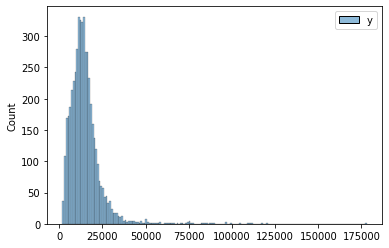

In [247]:
sns.histplot(mean_pred_lgb)

<AxesSubplot:ylabel='Count'>

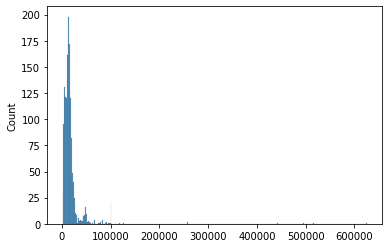

In [250]:
sns.histplot(np.exp(m_pred))

In [ ]:
# #距離の計算
# def circular_distance(lat1, logn1, lat2, logn2, data):
#     st_dist = []
#     for i in range(len(data)):
#         x = data.loc[i, :]
#         t = 6371 * np.arccos(np.cos(x[lat1]*np.pi/180)
#                         * np.cos(x[lat2]*np.pi/180)
#                         * np.cos(x[logn2]*np.pi/180 - x[logn1]*np.pi/180)
#                         + np.sin(x[lat1]*np.pi/180)
#                         * np.sin(x[lat2]*np.pi/180))
#         if np.isnan(t):
#             st_dist.append(0)
#         else:
#             st_dist.append(t)
#     return np.array(st_dist)

In [ ]:
# lat1 = 'latitude_x'
# lat2 = 'latitude_y'
# logn1 = 'longitude_x'
# logn2 = 'longitude_y'
# t_dist = circular_distance(lat1,logn1,lat2,logn2,df_train)
# t_dist

In [ ]:
# #マンハッタン距離を計算
# lat1 = 'latitude_x'
# lat2 = 'latitude_y'
# logn1 = 'longitude_x'
# logn2 = 'longitude_y'

# manht_dist_tr = circular_distance(lat1=lat1, logn1=logn1, lat2=lat2, logn2=logn1, data=dis_train) + circular_distance(lat1=lat1, logn1=logn1, lat2=lat1, logn2=logn2, data=dis_train)
# manht_dist_tr

In [ ]:
# manht_dist_ts = circular_distance(lat1=lat1, logn1=logn1, lat2=lat2, logn2=logn1, data=dis_test) + circular_distance(lat1=lat1, logn1=logn1, lat2=lat1, logn2=logn2, data=dis_test)
# manht_dist_ts

In [ ]:
# #マンハッタン距離の追加
# dis_train['st_dist_mht'] = manht_dist_tr
# dis_test['st_dist_mht'] = manht_dist_ts

In [ ]:
# #方位角の追加
# #90 - arctan2(sinΔx, cosy1tany2-siny1cosΔx)  ,Δx=x2-x1, arctan2(x, y)=arctan(y/x)
# def degree(lat1, logn1, lat2, logn2, data):
#     st_degre = []
#     for i in range(len(data)):
#         x = data.loc[i, :]
#         dx = x[lat2]-x[lat1]
#         d = 90 - np.arctan((np.cos(x[logn1])*np.tan(x[logn2])-np.sin(x[logn1])*np.cos(dx))/np.sin(dx))
#         if np.isnan(d):
#             st_degre.append(0)
#         else:
#             st_degre.append(d)
#     return np.array(st_degre)

In [ ]:
# lat1 = 'latitude_x'
# lat2 = 'latitude_y'
# logn1 = 'longitude_x'
# logn2 = 'longitude_y'

# degre_tr = degree(lat1, logn1, lat2, logn2, dis_train)
# degre_tr

In [ ]:
# lat1 = 'latitude_x'
# lat2 = 'latitude_y'
# logn1 = 'longitude_x'
# logn2 = 'longitude_y'

# degre_ts = degree(lat1, logn1, lat2, logn2, dis_test)
# degre_ts

In [ ]:
# #方位角の追加
# dis_train['degree'] = degre_tr
# dis_test['degree'] = degre_ts

In [ ]:
# #中間点の追加
# def center(lat1, logn1, lat2, logn2, data):
#     st_lat = []
#     st_logn = []
#     for i in range(len(data)):
#         x = data.loc[i, :]
#         lat = (x[lat2] + x[lat1])/2
#         logn = (x[logn2] + x[logn1])/2
#         if np.isnan(lat) or np.isnan(logn):
#             st_lat.append(0)
#             st_logn.append(0)
#         else:
#             st_lat.append(lat)
#             st_logn.append(logn)
#     return np.array(st_lat), np.array(st_logn)

In [ ]:
# lat_tr, logn_tr = center(lat1, logn1, lat2, logn2, dis_train)
# lat_ts, logn_ts = center(lat1, logn1, lat2, logn2, dis_test)

In [ ]:
# dis_train['lat_center'] = lat_tr
# dis_train['logn_center'] = logn_tr
# dis_test['lat_center'] = lat_ts
# dis_test['logn_center'] = logn_ts

In [ ]:
# dis_test.head()

In [ ]:
# #ランダムフォレストモデルの学習
# #標準化
# scaler = StandardScaler()
# scaler.fit(df_train)
# train_scaled = scaler.transform(df_train)

# #訓練データの分割
# X_train, X_test, y_train, y_test = train_test_split(train_scaled, y_log, test_size=0.2, random_state=100)

# rf = RandomForestRegressor(n_estimators=150)
# rf.fit(X_train, y_train)

# m_pred = rf.predict(X_test)

In [ ]:
# #ランダムフォレスト回帰の対数平均平方二乗誤差 (RMSLE)の評価
# rmsle = np.sqrt(mean_squared_log_error(y_true=y_test, y_pred=m_pred))
# print(rmsle)

In [ ]:
# #testデータでsubmitまで行う
# scaler = StandardScaler()
# scaler.fit(df_test)
# T_scaled = scaler.transform(df_test)

# T_pred = np.exp(rf.predict(T_scaled))

In [ ]:
# T_id = test_ids['id']
# target = pd.DataFrame({'y':T_pred})
# df_model = pd.concat([T_id, target], axis=1)
# df_model.to_csv('submission.csv', index=False)

In [ ]:
# dis_train.columns[2]

In [ ]:
# # cols = []
# vals = []
# for i, v in enumerate(rf.feature_importances_):
#     cols.append(dis_train.columns[i])
#     vals.append(v)
# tr_importance = pd.DataFrame({'features':cols,
#                               'importance':vals})
# tr_importance.sort_values(by='importance', ascending=False).head(50)

In [ ]:
# dis_test.shape, dis_train.shape

In [ ]:
# #testデータでsubmitまで行う
# scaler = StandardScaler()
# scaler.fit(dis_test)
# T_scaled = scaler.transform(dis_test)

# T_pred = np.exp(rf.predict(T_scaled))

In [ ]:
# T_pred

In [ ]:
# T_id = test_ids['id']
# target = pd.DataFrame({'y':T_pred})
# df_model = pd.concat([T_id, target], axis=1)
# df_model.to_csv('submission.csv', index=False)

In [ ]:
# #追加した特徴量を別データフレームに格納
# train_stay_days = sel_train[['short','weekly','monthly','2weekly','and_more']]
# train_area_cluster = sel_train['area_cluster']
# train_info_new = sel_train['info_new']

# test_stay_days = sel_test[['short','weekly','monthly','2weekly','and_more']]
# test_area_cluster = sel_test['area_cluster']
# test_info_new = sel_test['info_new']

In [ ]:
#ベースラインデータのコピー
lb_train = df_train[['latitude_x','longitude_x','minimum_nights','number_of_reviews','reviews_per_month','availability_365','longitude_y','latitude_y','st_dist','diffday_from_May1']].copy()
lb_test = df_test[['latitude_x','longitude_x','minimum_nights','number_of_reviews','reviews_per_month','availability_365','longitude_y','latitude_y','st_dist','diffday_from_May1']].copy()

In [ ]:
lb_train[['room_type','station_name']] = train[['room_type','station_name']]
lb_test[['room_type','station_name']] = test[['room_type','station_name']]

In [ ]:
lb_train.head()

In [ ]:
lb_test.head()

In [ ]:
df_merge = pd.concat([lb_train, lb_test])
df_merge

In [ ]:
#ラベルエンコーディングを行う
from sklearn.preprocessing import LabelEncoder

cols = ['room_type','station_name']

for c in cols:
    le = LabelEncoder()
    le.fit(df_merge[c])
    df_merge[c] = le.transform(df_merge[c])

In [ ]:
df_merge

In [ ]:
lb_train = df_merge[:len(lb_train)]
lb_test = df_merge[len(lb_train):]

In [ ]:
len(lb_train), len(lb_test)

In [ ]:
train_ids

In [ ]:
lb_train['host_id'] = np.log(train_ids['host_id'])
lb_test['host_id'] = np.log(test_ids['host_id'])

In [ ]:
#マンハッタン距離の追加
lb_train['st_dist_mht'] = manht_dist_tr
lb_test['st_dist_mht'] = manht_dist_ts
#方位角の追加
lb_train['degree'] = degre_tr
lb_test['degree'] = degre_ts
#中間点の追加
lb_train['lat_center'] = lat_tr
lb_train['logn_center'] = logn_tr
lb_test['lat_center'] = lat_ts
lb_test['logn_center'] = logn_ts

In [ ]:
lb_train.head()

In [ ]:
lb_train.drop(columns=['host_id','st_dist_mht','degree'], inplace=True)
lb_test.drop(columns=['host_id','st_dist_mht','degree'], inplace=True)

In [ ]:
#漢字か英語かのフラグを足す
lb_train[['english','kanji']] = ch_name_tr[['english','kanji']]
lb_test[['english','kanji']] = ch_name_ts[['english','kanji']]

In [ ]:
#勾配ブｰスティングモデルの学習
#標準化
scaler = StandardScaler()
scaler.fit(lb_train)
train_scaled = scaler.transform(lb_train)

#訓練データの分割
X_train, X_test, y_train, y_test = train_test_split(train_scaled, y_log, test_size=0.2, random_state=100)

gb = GradientBoostingRegressor(n_estimators=1500, learning_rate=0.2)
gb.fit(X_train, y_train)

m_pred = gb.predict(X_test)

In [ ]:
#勾配ブｰスティングモデルの対数平均平方二乗誤差 (RMSLE)の評価
rmsle = np.sqrt(mean_squared_log_error(y_true=y_test, y_pred=m_pred))
print(rmsle)

In [ ]:
#testデータでsubmitまで行う
scaler = StandardScaler()
scaler.fit(lb_test)
T_scaled = scaler.transform(lb_test)

T_pred = np.exp(gb.predict(T_scaled))

In [ ]:
cols = []
vals = []
for i, v in enumerate(gb.feature_importances_):
    cols.append(lb_train.columns[i])
    vals.append(v)
tr_importance = pd.DataFrame({'features':cols,
                              'importance':vals})
tr_importance.sort_values(by='importance', ascending=False).head(50)

In [ ]:
lb_test

In [ ]:
# #hostidの追加
# ch_train['host_id'] = np.log(train_ids['host_id'])
# ch_test['host_id'] = np.log(test_ids['host_id'])

In [ ]:
df_train

In [ ]:
#ランダムフォレストモデルを用いて交差検証を行う
def forestmodel(train, test, y, model):

    scores = []
    preds = []
    i = 1
    scaler = StandardScaler()
    scaler.fit(train)
    train_scaled = scaler.transform(train)
    scaler = StandardScaler()
    scaler.fit(test)
    test_scaled = scaler.transform(test)
    kf = KFold(n_splits=4, shuffle=True, random_state=0)
    for tr_idx, va_idx in kf.split(train):
        tr_x, va_x = train_scaled[tr_idx], train_scaled[va_idx]
        tr_y, va_y = y.iloc[tr_idx], y.iloc[va_idx]

        model = model
        model.fit(tr_x, tr_y)
        k_pred = model.predict(va_x)
        rmsle = np.sqrt(mean_squared_log_error(y_true=va_y, y_pred=k_pred))
        scores.append(rmsle)
        print(f'{str(i)}回目, rmsle: {rmsle:.4f}')
        i += 1
        pred_t = model.predict(test_scaled)
        preds.append(np.exp(pred_t))
    return scores, preds

In [ ]:
result = forestmodel(train=df_train, test=df_test, y=y_log, model=RandomForestRegressor(n_estimators=150))

In [ ]:
re_sum = []
for i, v in enumerate(result[1]):
    if i == 0:
        re_sum.append(v)
    else:
        re_sum += v
re_sum/4

In [ ]:
re_sum

In [ ]:
T_id = test_ids['id']
target = pd.DataFrame({'y':T_pred})
df_model = pd.concat([T_id, target], axis=1)
df_model.to_csv('submission.csv', index=False)